### Problem Statement
An education company named X Education sells online courses to industry professionals. On any given day, many professionals who are interested in the courses land on their website and browse for courses.

The company markets its courses on several websites and search engines like Google. Once these people land on the website, they might browse the courses or fill up a form for the course or watch some videos. When these people fill up a form providing their email address or phone number, they are classified to be a lead. Moreover, the company also gets leads through past referrals. Once these leads are acquired, employees from the sales team start making calls, writing emails, etc. Through this process, some of the leads get converted while most do not. The typical lead conversion rate at X education is around 30%.

Now, although X Education gets a lot of leads, its lead conversion rate is very poor. For example, if, say, they acquire 100 leads in a day, only about 30 of them are converted. To make this process more efficient, the company wishes to identify the most potential leads, also known as ‘Hot Leads’. If they successfully identify this set of leads, the lead conversion rate should go up as the sales team will now be focusing more on communicating with the potential leads rather than making calls to everyone. A typical lead conversion process can be represented using the following funnel:

Lead Conversion Process - Demonstrated as a funnel As you can see, there are a lot of leads generated in the initial stage (top) but only a few of them come out as paying customers from the bottom. In the middle stage, you need to nurture the potential leads well (i.e. educating the leads about the product, constantly communicating etc. ) in order to get a higher lead conversion.

X Education has appointed you to help them select the most promising leads, i.e. the leads that are most likely to convert into paying customers. The company requires you to build a model wherein you need to assign a lead score to each of the leads such that the customers with higher lead score have a higher conversion chance and the customers with lower lead score have a lower conversion chance. The CEO, in particular, has given a ballpark of the target lead conversion rate to be around 80%.

### Data:

You have been provided with a leads dataset from the past with around 9000 data points. This dataset consists of various attributes such as Lead Source, Total Time Spent on Website, Total Visits, Last Activity, etc. which may or may not be useful in ultimately deciding whether a lead will be converted or not. The target variable, in this case, is the column ‘Converted’ which tells whether a past lead was converted or not wherein 1 means it was converted and 0 means it wasn’t converted. You can learn more about the dataset from the data dictionary provided in the zip folder at the end of the page. Another thing that you also need to check out for are the levels present in the categorical variables. Many of the categorical variables have a level called 'Select' which needs to be handled because it is as good as a null value (think why?).


### Goals of the Case Study:
    
There are quite a few goals for this case study.
Build a logistic regression model to assign a lead score between 0 and 100 to each of the leads which can be used by the company to target potential leads. A higher score would mean that the lead is hot, i.e. is most likely to convert whereas a lower score would mean that the lead is cold and will mostly not get converted.
There are some more problems presented by the company which your model should be able to adjust to if the company's requirement changes in the future so you will need to handle these as well. These problems are provided in a separate doc file. Please fill it based on the logistic regression model you got in the first step. Also, make sure you include this in your final PPT where you'll make recommendations.

### Lead Scoring Case Study Goals of the Case Study :

Build a logistic regression model to assign a lead score between 0 and 100 to each of the leads which can be used by the company to target potential leads. A higher score would mean that the lead is hot, i.e. is most likely to convert whereas a lower score would mean that the lead is cold and will mostly not get converted.

In [1]:
# importing required libraries for Data reading and understanding purpose
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# importing libraries for suppressing warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
## importing other libraries req. for model building and scaling:

import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [3]:
import plotly
from plotly import tools
import plotly.express as px

In [4]:
# Data display:

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

### Data Preparation - Reading the csv file:

In [5]:
leads = pd.read_csv('Leads.csv')

leads.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Interested in other courses,Low in Relevance,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,NaN,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Select,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Not Sure,No,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,Select,Other,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [6]:
# Shape of the data set

leads.shape  ## 9240 rows and 37 columns

(9240, 37)

In [7]:
# Info of the data set: data types, total entries

leads.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

#### 7 numerical variables ; 30 categorical variables

In [8]:
### Statistical Info:

leads.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


##### There are some outliers present in a few columns: Total Visits, Total time spent on website, Page Views Per Visit

### Understanding the data & Visualization:

In [9]:
# Checking the percentage of Null or missing values

round(100*(leads.isnull().sum()/len(leads.index)), 2)

Prospect ID                                       0.00
Lead Number                                       0.00
Lead Origin                                       0.00
Lead Source                                       0.39
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       1.48
Total Time Spent on Website                       0.00
Page Views Per Visit                              1.48
Last Activity                                     1.11
Country                                          26.63
Specialization                                   15.56
How did you hear about X Education               23.89
What is your current occupation                  29.11
What matters most to you in choosing a course    29.32
Search                                            0.00
Magazine                                          0.00
Newspaper 

In [10]:
### checking for Duplicate values

leads.duplicated().any()  ## There are no duplicate values in data.

False

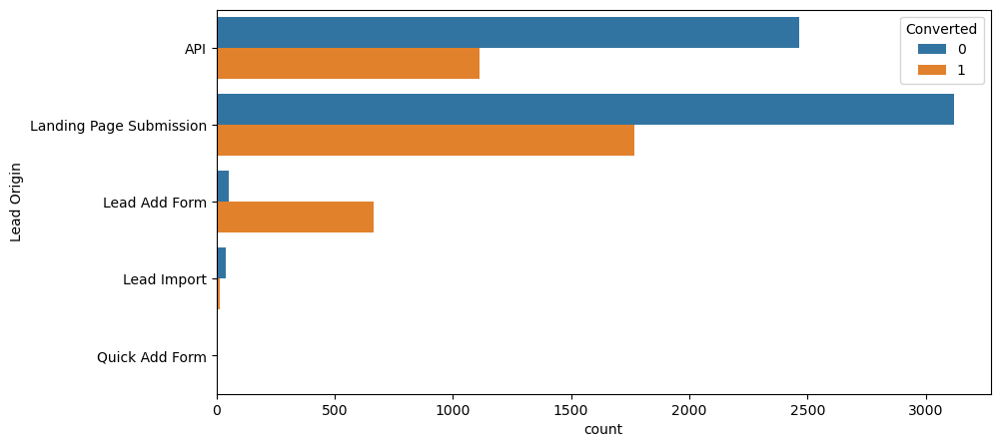

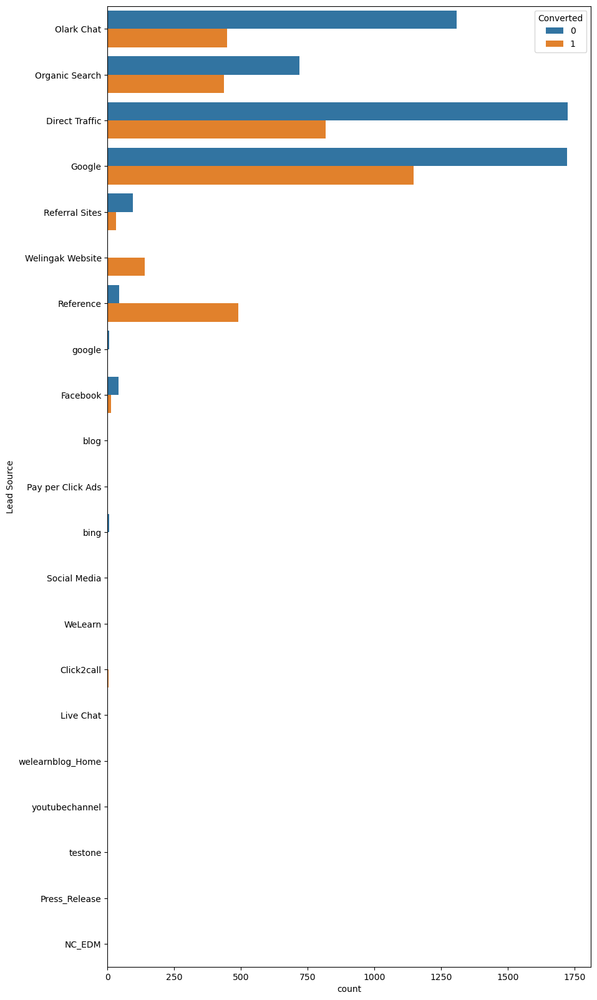

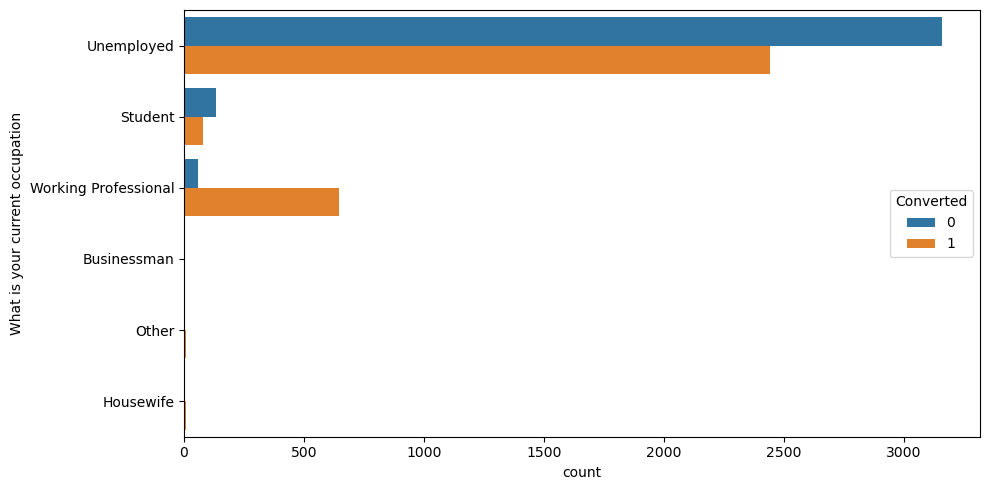

In [11]:
## Understanding Lead Conversion and Lead Origin

plt.figure(figsize=(10, 5))
sns.countplot(y="Lead Origin", hue="Converted", data=leads)
plt.show()

# Understanding Lead Conversion Lead Source

plt.figure(figsize=(10, 20))
sns.countplot(y="Lead Source", hue="Converted", data=leads)
plt.show()

# Understanding Lead Conversion and Current Occupation 

plt.figure(figsize=(10, 5))
sns.countplot(y="What is your current occupation", hue="Converted", data=leads)

plt.tight_layout()
plt.show()

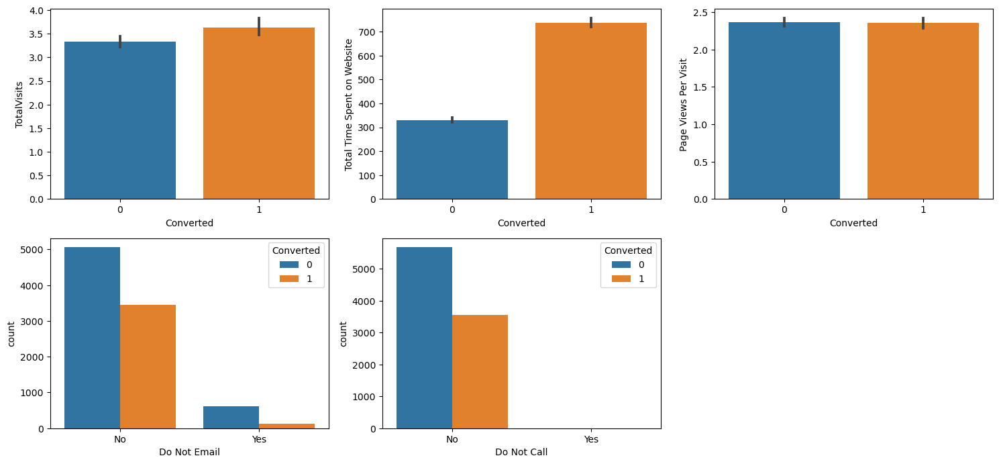

In [12]:
# Understanding the Lead Conversion on TotalVisits, Total Time Spent on Website, Page Views Per Visit,do not email,do not call.

plt.figure(figsize=(15,10))

plt.subplot(3,3,1)
sns.barplot(x = 'Converted', y = 'TotalVisits', data = leads)

plt.subplot(3,3,2)
sns.barplot(x = 'Converted', y = 'Total Time Spent on Website',data = leads)

plt.subplot(3,3,3)
sns.barplot(x = 'Converted', y = 'Page Views Per Visit',data = leads)

plt.subplot(3,3,4)
sns.countplot(x="Do Not Email", hue="Converted",data = leads)

plt.subplot(3,3,5)
sns.countplot(x="Do Not Call", hue="Converted",data = leads)
      
plt.tight_layout()
plt.show()

#### Insights from the Analysis:

- lead conversion is higher from 'Landing Page Submission'

- Important lead conversion source is 'Google'

- Major lead conversion is from the 'Unemployed Group' followed  by 'working professional'

- Major lead conversion happened from 'TotalVisits, Total Time Spent on Website, Page Views Per Visit

- Lead conversion has happened through emails compared to calls

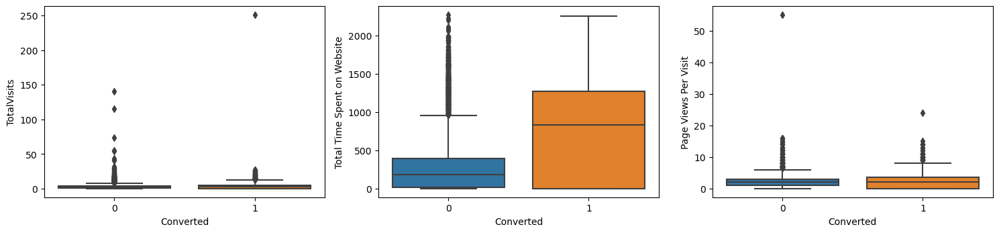

In [13]:
## checking for outliers in Numerical variables:

plt.figure(figsize=(15,10))

# TotalVisits:

plt.subplot(3,3,1)
sns.boxplot(x='Converted', y='TotalVisits', data=leads)

# Total Time Spent on Website

plt.subplot(3,3,2)
sns.boxplot(x='Converted', y='Total Time Spent on Website', data=leads)

# Page Views Per Visit
plt.subplot(3,3,3)
sns.boxplot(x='Converted', y='Page Views Per Visit', data=leads)

      
plt.tight_layout()
plt.show()

#### There are potential outliers present in 'total visits' and 'pages views per visit'

### Data Cleaning:

-- Cleaning the dataset by removing the redundant variables/features

-- Some columns are having label as ‘Select’ which means customer chose to not answer this question.    Thus we would label null value to 'select' label

-- Dropping columns having more than 40% null values

-- Imputation missing values

In [14]:
# checking the value counts of each variables to find insights

for column in leads.columns:
    print(f"Column: {column}")
    print(leads[column].value_counts())
    print('---------------------------------------')

Column: Prospect ID
7927b2df-8bba-4d29-b9a2-b6e0beafe620    1
22e9d4ef-d294-4ebf-81c7-7c7a1105aeea    1
46befc49-253a-419b-abea-2fd978d2e2b1    1
9d35a2c2-09d8-439f-9875-0e8bbf267f5a    1
f0de9371-4dc2-48c2-9785-a08d6fc4fcb5    1
446a290f-b78f-413b-8912-d9c79a847e3a    1
38826741-ffe2-4d37-89c4-1140c66c5560    1
f08604ae-a2fa-4d64-8a42-a95ff2bddfed    1
ce9c2fa0-d2ff-493d-82a9-20c81b175b3e    1
13e3716d-528a-4e90-a441-51ab1d0184d1    1
0047124c-2a76-4c2d-b4e4-83cb2331dbec    1
9608eda6-d8bb-45ec-ab12-eb3c49d52b0f    1
07a52472-4b5d-446f-9048-ffdc7bc65e96    1
804e0cfb-559d-4a63-a635-573f7cfdf441    1
65954c34-8ce7-4d9b-8ae0-f15f15bc9055    1
e02efa11-5bf6-40ee-9194-75d3fffef1d3    1
297fd0fa-69e5-49cf-b794-94c103e388d7    1
f4217ab4-81fd-42d9-a9b4-f8bbfaf1578b    1
b3af7901-09d8-49b7-803f-1cd1e1e8878a    1
7bcca8a9-60ab-4a36-a7f9-cd85aeb10a70    1
13931a86-7053-4522-af99-9e6ae1a6e9b8    1
a303766c-f688-4908-bda8-5fc6d8a35bb8    1
10d4109f-eaa0-42a2-887e-6e0f5d83af44    1
321a15ce-0a20-

#### Insights:
    
-- Lead Number - not required

-- Prospect ID - not required

-- Magazine - column only has 'No', its a redundant variable

-- Country- not required

-- Receive More Updates About Our Courses- column only has 'No',its a redundant variable

-- Update me on Supply Chain Content - column only has 'No',its a redundant variable

-- Get updates on DM Content - column only has 'No', its a redundant variable

-- I agree to pay the amount through cheque -column only has 'No', its a redundant variable.

#### Transform below columns of yes/no category to 1/0(Binary) numerical:

-- Do Not Email

-- Do Not Call

-- Search

-- Newspaper Article

-- Digital Advertisement

-- Through Recommendations

-- a free copy of Mastering The Interview

-- X Education Forums

-- Newspaper

#### Dropping - Redundant variables

In [15]:

leads.drop(['Prospect ID', 'Lead Number', 'Country', 'Receive More Updates About Our Courses',
              'Update me on Supply Chain Content', 'Get updates on DM Content', 'City',
              'I agree to pay the amount through cheque','Magazine'], axis = 1, inplace = True)


In [16]:
leads.shape

(9240, 28)

In [17]:
# replacing 'Select' with NaN

leads.replace({'Select': np.nan}, inplace = True)

#### Dropping columns having missing values above 40 %

In [18]:
missing_cols = [col for col in leads.columns if (leads[col].isnull().sum() / len(leads) * 100) > 40]

leads.drop(missing_cols, axis=1, inplace=True)

leads.head()

,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,What matters most to you in choosing a course,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Tags,A free copy of Mastering The Interview,Last Notable Activity
0,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,Unemployed,Better Career Prospects,No,No,No,No,No,No,Interested in other courses,No,Modified
1,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,NaN,Unemployed,Better Career Prospects,No,No,No,No,No,No,Ringing,No,Email Opened
2,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,Business Administration,Student,Better Career Prospects,No,No,No,No,No,No,Will revert after reading the email,Yes,Email Opened
3,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,Media and Advertising,Unemployed,Better Career Prospects,No,No,No,No,No,No,Ringing,No,Modified
4,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,NaN,Unemployed,Better Career Prospects,No,No,No,No,No,No,Will revert after reading the email,No,Modified


In [19]:
leads.shape ## After dropping null value columns > 40%

(9240, 21)

In [20]:
# Checking the percentage of Null or missing values

round(100*(leads.isnull().sum()/len(leads.index)), 2)

Lead Origin                                       0.00
Lead Source                                       0.39
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       1.48
Total Time Spent on Website                       0.00
Page Views Per Visit                              1.48
Last Activity                                     1.11
Specialization                                   36.58
What is your current occupation                  29.11
What matters most to you in choosing a course    29.32
Search                                            0.00
Newspaper Article                                 0.00
X Education Forums                                0.00
Newspaper                                         0.00
Digital Advertisement                             0.00
Through Recommendations                           0.00
Tags      

#### confirmed that the null value columns > 40% are dropped!

### Missing Values Imputation

In [21]:
# Columns having missing values - below 40 %

below_40 = list(round(100*(leads.isnull().sum()/len(leads.index)), 2)[round(100*(leads.isnull().sum()/len(leads.index)), 2) > 0].index)

below_40

['Lead Source',
 'TotalVisits',
 'Page Views Per Visit',
 'Last Activity',
 'Specialization',
 'What is your current occupation',
 'What matters most to you in choosing a course',
 'Tags']

##### Note:- the columns: 'Last Activity', 'Tags' are provided by sales team.  We will remove them before model building as the we don't a model having these features

In [22]:
# Handling 'Lead Source'

leads['Lead Source'].value_counts(dropna = False, normalize = True).mul(100).round(2)

Google               31.04
Direct Traffic       27.52
Olark Chat           18.99
Organic Search       12.49
Reference             5.78
Welingak Website      1.54
Referral Sites        1.35
Facebook              0.60
NaN                   0.39
bing                  0.06
google                0.05
Click2call            0.04
Press_Release         0.02
Social Media          0.02
Live Chat             0.02
youtubechannel        0.01
testone               0.01
Pay per Click Ads     0.01
welearnblog_Home      0.01
WeLearn               0.01
blog                  0.01
NC_EDM                0.01
Name: Lead Source, dtype: float64

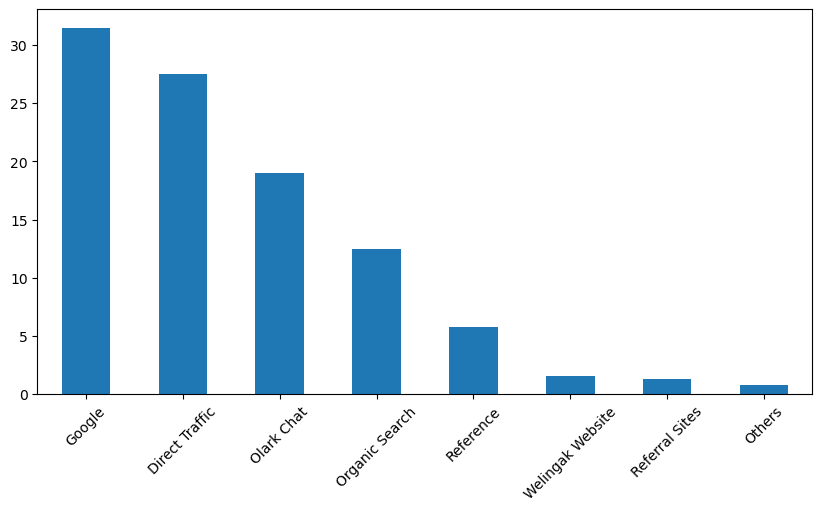

In [23]:
# Imputation of most frequent level, 'Google' (mode - imputation)

leads['Lead Source'] = leads['Lead Source'].replace(np.nan,'Google')

#replacing google with Google
leads['Lead Source'] = leads['Lead Source'].replace('google','Google')

# combining less frequent levels into one, 'Others'
x = leads['Lead Source'].value_counts(normalize = True).mul(100)

leads['Lead Source'] = leads['Lead Source'].replace(list(x[x < 1].index), 'Others')

leads['Lead Source'].value_counts(dropna = False, normalize = True).mul(100).round(2).plot(kind = 'bar', figsize = [10,5])

plt.xticks(rotation = 45)

plt.show()

In [24]:
print('Missing values count --->', leads['Lead Source'].isna().sum())

Missing values count ---> 0


In [25]:
# Handling 'Specialization':

print(leads['Specialization'].value_counts())
print('-----------')
print('Missing values count --->', leads['Specialization'].isna().sum())

Finance Management                   976
Human Resource Management            848
Marketing Management                 838
Operations Management                503
Business Administration              403
IT Projects Management               366
Supply Chain Management              349
Banking, Investment And Insurance    338
Travel and Tourism                   203
Media and Advertising                203
International Business               178
Healthcare Management                159
Hospitality Management               114
E-COMMERCE                           112
Retail Management                    100
Rural and Agribusiness                73
E-Business                            57
Services Excellence                   40
Name: Specialization, dtype: int64
-----------
Missing values count ---> 3380


In [26]:
# Specialization - industry domain in which the customer worked before
# Replacing NaN's with 'Others' as these values may correspond to students/freshers

leads['Specialization'].value_counts(dropna = False, normalize = True).mul(100).round(2)

NaN                                  36.58
Finance Management                   10.56
Human Resource Management             9.18
Marketing Management                  9.07
Operations Management                 5.44
Business Administration               4.36
IT Projects Management                3.96
Supply Chain Management               3.78
Banking, Investment And Insurance     3.66
Travel and Tourism                    2.20
Media and Advertising                 2.20
International Business                1.93
Healthcare Management                 1.72
Hospitality Management                1.23
E-COMMERCE                            1.21
Retail Management                     1.08
Rural and Agribusiness                0.79
E-Business                            0.62
Services Excellence                   0.43
Name: Specialization, dtype: float64

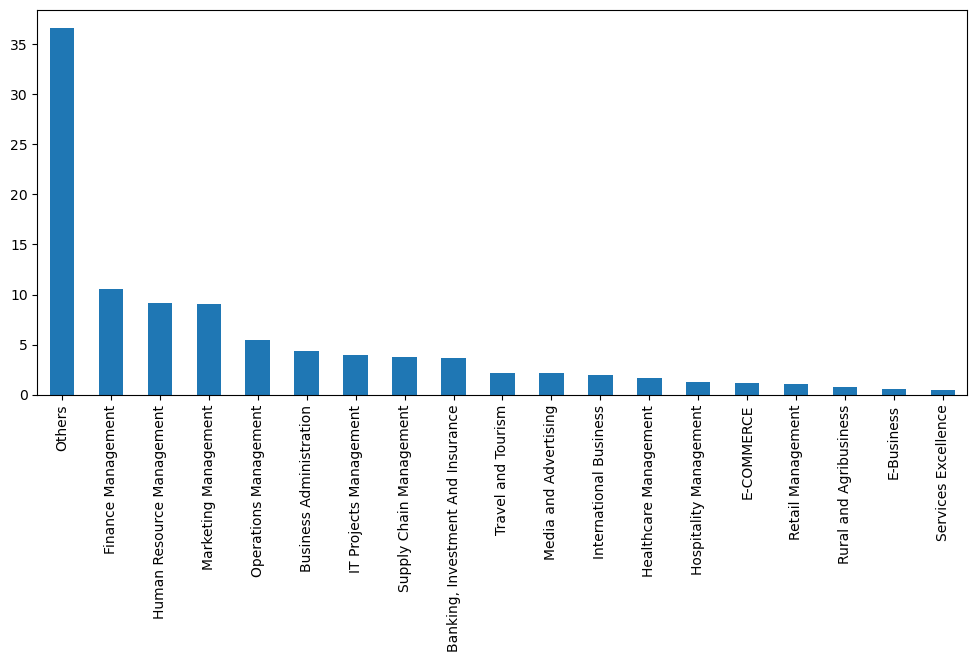

In [27]:
leads['Specialization'].fillna('Others', inplace = True)

leads['Specialization'].value_counts(dropna = False, normalize = True).mul(100).round(2).plot(kind = 'bar', figsize = [12,5])

plt.show()

In [28]:
print('Missing values count --->', leads['Specialization'].isna().sum())

Missing values count ---> 0


In [29]:
## 3. Handling: 'What is your current occupation'

print(leads['What is your current occupation'].value_counts())
print('-----------')
print('Missing values count --->', leads['What is your current occupation'].isna().sum())

Unemployed              5600
Working Professional     706
Student                  210
Other                     16
Housewife                 10
Businessman                8
Name: What is your current occupation, dtype: int64
-----------
Missing values count ---> 2690


In [30]:
# replacing missing values with label 'Unemployed'

leads['What is your current occupation'] = leads['What is your current occupation'].replace(np.NaN,'Unemployed')

leads['What is your current occupation'].value_counts()

Unemployed              8290
Working Professional     706
Student                  210
Other                     16
Housewife                 10
Businessman                8
Name: What is your current occupation, dtype: int64

In [31]:
print('Missing values count --->', leads['What is your current occupation'].isna().sum())

Missing values count ---> 0


In [32]:
# 4. Handling: 'What matters most to you in choosing a course'

print(leads['What matters most to you in choosing a course'].value_counts())
print('-----------')
print('Missing values count --->', leads['What matters most to you in choosing a course'].isna().sum())

Better Career Prospects      6528
Flexibility & Convenience       2
Other                           1
Name: What matters most to you in choosing a course, dtype: int64
-----------
Missing values count ---> 2709


#### Huge percentage of values excluding null values are 'Better Career Prospects' and after imputing the most frequent level, the other levels remain insignificant. So, this column can be dropped as it will not be useful for analysis.

In [33]:
leads.drop('What matters most to you in choosing a course', axis= 1, inplace = True)

leads.head()

,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Tags,A free copy of Mastering The Interview,Last Notable Activity
0,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,Others,Unemployed,No,No,No,No,No,No,Interested in other courses,No,Modified
1,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,Others,Unemployed,No,No,No,No,No,No,Ringing,No,Email Opened
2,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,Business Administration,Student,No,No,No,No,No,No,Will revert after reading the email,Yes,Email Opened
3,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,Media and Advertising,Unemployed,No,No,No,No,No,No,Ringing,No,Modified
4,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,Others,Unemployed,No,No,No,No,No,No,Will revert after reading the email,No,Modified


In [34]:
# Handling:  5. 'TotalVisits', 6. 'Page Views Per Visit', 7. 'Last Activity', 8. 'Tags'

# checking value counts and missing values count for all the columns

miss_max = ['TotalVisits','Page Views Per Visit','Last Activity','Tags'] # assigning them in a list

for i in leads[miss_max].columns:
    print(leads[i].value_counts())
    print('-----------')
    print('Missing values count --->', leads[i].isna().sum())

0.0      2189
2.0      1680
3.0      1306
4.0      1120
5.0       783
6.0       466
1.0       395
7.0       309
8.0       224
9.0       164
10.0      114
11.0       86
13.0       48
12.0       45
14.0       36
16.0       21
15.0       18
17.0       16
18.0       15
20.0       12
19.0        9
21.0        6
23.0        6
24.0        5
25.0        5
27.0        5
22.0        3
29.0        2
28.0        2
26.0        2
141.0       1
55.0        1
30.0        1
43.0        1
74.0        1
41.0        1
54.0        1
115.0       1
251.0       1
32.0        1
42.0        1
Name: TotalVisits, dtype: int64
-----------
Missing values count ---> 137
0.00     2189
2.00     1795
3.00     1196
4.00      896
1.00      651
5.00      517
1.50      306
6.00      244
2.50      241
7.00      133
3.50       94
8.00       86
1.33       66
1.67       60
2.33       59
2.67       54
9.00       45
4.50       43
1.75       28
3.33       27
10.00      25
1.25       23
5.50       21
2.25       19
11.00      18
3.

In [35]:
# Imputing all the missing values with label having max occurences(mode)

for i in leads[miss_max].columns:
    max_str = leads[i].value_counts()[leads[i].value_counts() == leads[i].value_counts().max()].index[0]
    leads[i] = leads[i].fillna(value=max_str)
    print(leads[i].value_counts())
    print('-----------')
    print('Missing values count --->', leads[i].isna().sum())
    print('=================================================================')

0.0      2326
2.0      1680
3.0      1306
4.0      1120
5.0       783
6.0       466
1.0       395
7.0       309
8.0       224
9.0       164
10.0      114
11.0       86
13.0       48
12.0       45
14.0       36
16.0       21
15.0       18
17.0       16
18.0       15
20.0       12
19.0        9
21.0        6
23.0        6
24.0        5
25.0        5
27.0        5
22.0        3
29.0        2
28.0        2
26.0        2
141.0       1
55.0        1
30.0        1
43.0        1
74.0        1
41.0        1
54.0        1
115.0       1
251.0       1
32.0        1
42.0        1
Name: TotalVisits, dtype: int64
-----------
Missing values count ---> 0
0.00     2326
2.00     1795
3.00     1196
4.00      896
1.00      651
5.00      517
1.50      306
6.00      244
2.50      241
7.00      133
3.50       94
8.00       86
1.33       66
1.67       60
2.33       59
2.67       54
9.00       45
4.50       43
1.75       28
3.33       27
10.00      25
1.25       23
5.50       21
2.25       19
11.00      18
3.67

In [36]:
# checking rows having missing values more than 40%

missing_row_count = leads.apply(lambda x: round(100*(sum(x.isnull().values)/len(leads.index)),2), axis = 1)
missing_row_count[missing_row_count > 40]

Series([], dtype: float64)

#### No rows with missing values after imputation!

In [37]:
# checking if any more null values in any columns

leads.isna().sum()

Lead Origin                               0
Lead Source                               0
Do Not Email                              0
Do Not Call                               0
Converted                                 0
TotalVisits                               0
Total Time Spent on Website               0
Page Views Per Visit                      0
Last Activity                             0
Specialization                            0
What is your current occupation           0
Search                                    0
Newspaper Article                         0
X Education Forums                        0
Newspaper                                 0
Digital Advertisement                     0
Through Recommendations                   0
Tags                                      0
A free copy of Mastering The Interview    0
Last Notable Activity                     0
dtype: int64

### Outcomes from Imputation of missing values:

-- Missing values are cleaned up (dropped in few cases)

-- Missing values - Mode imputation for few columns as required

-- Now we will proceed with data transformation for some columns having yes/no labels and will convert columns with numerical data to categorical data.

### Outlier Analysis & Handling:

In [38]:
# checking the statistical data

leads.describe(percentiles=[0.25,0.50,0.75,0.90,0.95,0.97,0.99])

,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,9240.000000,9240.000000,9240.000000,9240.000000
mean,0.385390,3.394156,487.698268,2.327787
std,0.486714,4.836682,548.021466,2.164258
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,12.000000,0.000000
50%,0.000000,3.000000,248.000000,2.000000
75%,1.000000,5.000000,936.000000,3.000000
90%,1.000000,7.000000,1380.000000,5.000000
95%,1.000000,10.000000,1562.000000,6.000000
97%,1.000000,11.000000,1660.000000,7.000000


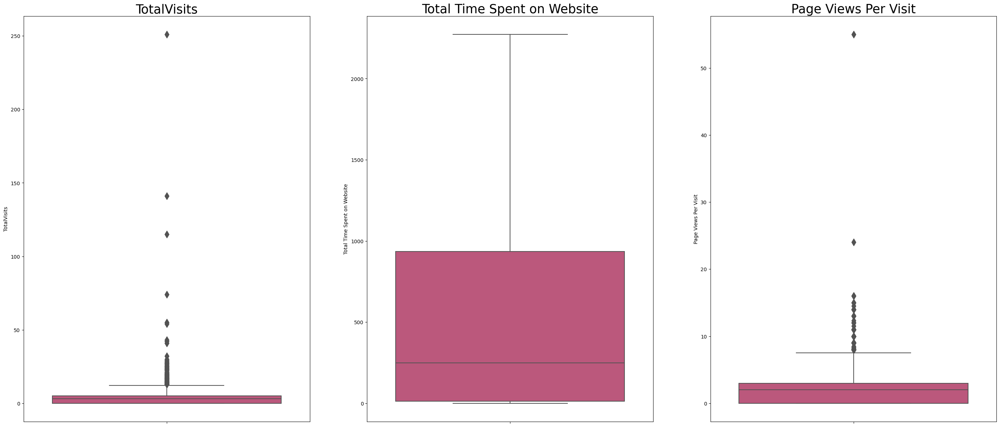

In [39]:
# setting figure size
plt.figure(figsize=(35,50))

# Title names for the columns in the dataset

col_title= {0:'TotalVisits',1:'Total Time Spent on Website',2:'Page Views Per Visit'}

# Visualising the outliers with boxplot for all the variables 

for i in range(3):
    plt.subplot(3,3,i+1)
    plt.title(col_title[i],fontsize=25)
    sns.boxplot(y=leads[col_title[i]],data=leads,palette='plasma',fliersize=10)

#### Presence of these extreme outliers can effect the performance of model. We can get rid of these.

In [40]:
lim1 = leads['TotalVisits'].quantile(0.995)
lim2 = leads['Page Views Per Visit'].quantile(0.995)

In [41]:
leads = leads[~((leads['TotalVisits'] > lim1) | (leads['Page Views Per Visit'] > lim2))]

In [42]:
leads.shape

(9167, 20)

### Exploratory Data Analysis

In [43]:
# Imbalance in target

leads['Converted'].value_counts()

0    5636
1    3531
Name: Converted, dtype: int64

In [44]:
# visualizing imbalance:

im = leads['Converted'].value_counts()

im_leads = pd.DataFrame({'labels': im.index,'values': im.values})

px.pie(im_leads, names ='labels',values='values', title='Target Imbalance', hole = 0.35)

In [45]:
#catagorical columns

cat_cols = [col for col in leads.select_dtypes(exclude = np.number).columns]
cat_cols

['Lead Origin',
 'Lead Source',
 'Do Not Email',
 'Do Not Call',
 'Last Activity',
 'Specialization',
 'What is your current occupation',
 'Search',
 'Newspaper Article',
 'X Education Forums',
 'Newspaper',
 'Digital Advertisement',
 'Through Recommendations',
 'Tags',
 'A free copy of Mastering The Interview',
 'Last Notable Activity']

In [46]:
# Distinct levels in catagorical columns

leads[cat_cols].nunique().sort_values()

Do Not Email                               2
Do Not Call                                2
Search                                     2
Newspaper Article                          2
X Education Forums                         2
Newspaper                                  2
Digital Advertisement                      2
Through Recommendations                    2
A free copy of Mastering The Interview     2
Lead Origin                                5
What is your current occupation            6
Lead Source                                8
Last Notable Activity                     16
Last Activity                             17
Specialization                            19
Tags                                      26
dtype: int64

In [47]:
# Binary catagorical variables
x = leads[cat_cols].nunique()

binary_cat_cols = list(x[x == 2].index)
binary_cat_cols

['Do Not Email',
 'Do Not Call',
 'Search',
 'Newspaper Article',
 'X Education Forums',
 'Newspaper',
 'Digital Advertisement',
 'Through Recommendations',
 'A free copy of Mastering The Interview']

In [48]:
sns.set_style("whitegrid", {"grid.color": ".2", "grid.linestyle": ":"})

In [49]:
#Function for visualizing composition of levels in catagorical variables, count plot

def hue_count(x, y, p = 'deep'):
    ax = sns.countplot(leads[x], hue = leads[y], palette = p)
    ax.set_title('"{}" Composition'.format(x), fontsize = 15, fontweight = 'bold', pad = 5)
    ax.set_xlabel(x, fontsize = 14)
    ax.set_ylabel('Count', fontsize = 14)
    ax.patch.set_edgecolor('black')
    ax.patch.set_linewidth(1.5)  


#Function for visualizing numerical and catagorical variables together, box plot

def box_plot2(x, y, p = 'deep'):
    ax = sns.boxplot(leads[x], leads[y], palette = p, showfliers = True, showmeans = True, 
                     meanprops={"marker":"s","markerfacecolor":"white", "markeredgecolor":"crimson"})
    ax.set_title('Distribution of "{}"'.format(y), fontsize = 15, fontweight = 'bold', pad = 5)
    ax.patch.set_edgecolor('black')
    ax.patch.set_linewidth(1.5)

### Conversion Rate:

Conversion rate is calculated as the number of leads that converted per total number of leads, expressed as a percentage.

Conversion Rate = (Number of Conversions / Total number of Leads) * 100

In [50]:
#Function for visualizing conversion rate of categories

def conversion_rate_plot(x, y = 'Converted', p = 'deep'):
    ax = sns.barplot(leads[x], leads[y], estimator = np.mean, palette = p, ci = None)
    ax.set_title('Conversion Rate'.format(y,x), fontsize = 15, fontweight = 'bold', pad = 5)
    ax.set_xlabel(x, fontsize = 14)
    ax.set_ylabel('Rate', fontsize = 14)
    ax.patch.set_edgecolor('black')
    ax.patch.set_linewidth(1.5)
    for k in ax.patches:
        ax.annotate('{:.1f} %'.format(k.get_height()*100),(k.get_x()+0.25, k.get_height()))

In [51]:
#Lead Origin

leads['Lead Origin'].value_counts(normalize = True).mul(100).round(2)

Landing Page Submission    52.68
API                        38.89
Lead Add Form               7.82
Lead Import                 0.60
Quick Add Form              0.01
Name: Lead Origin, dtype: float64

In [52]:
# Adding quick Add form to Lead Add Form

leads['Lead Origin'].replace({'Quick Add Form': 'Lead Add Form'}, inplace = True)

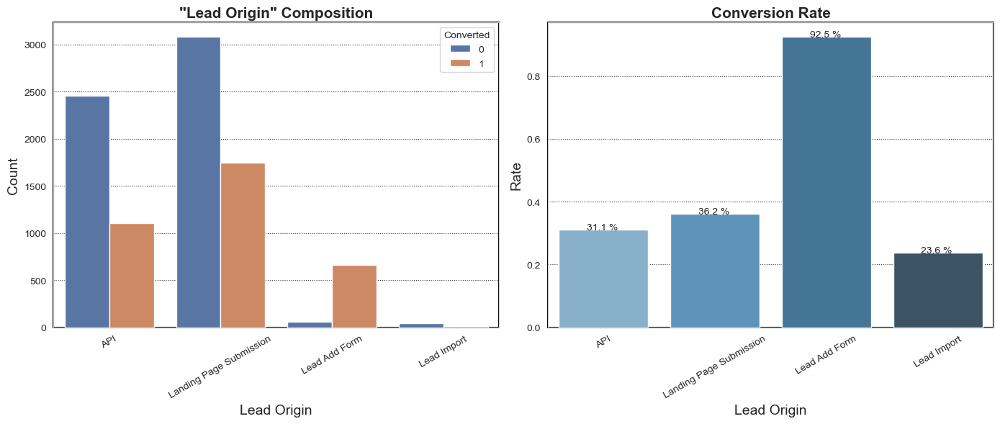

In [53]:
#Lead Origin

plt.figure(figsize = [14,6])
plt.subplot(121)
hue_count('Lead Origin', 'Converted')
plt.xticks(rotation = 30)

# Rate of conversion
plt.subplot(122)
conversion_rate_plot('Lead Origin', 'Converted', p = 'Blues_d')
plt.xticks(rotation = 30)

plt.tight_layout()

-- No. of customers - identified as leads by API and Landing Page Submission are highest, but their conversion rate is less than the average overall conversion rate ~ 38.5 %.

-- Eventhough, Lead Add Form identifies brings in less leads but the conversion rate of the leads identified by the it is very high. 

-- Company should try to bring in more leads by 'Lead Add Form'

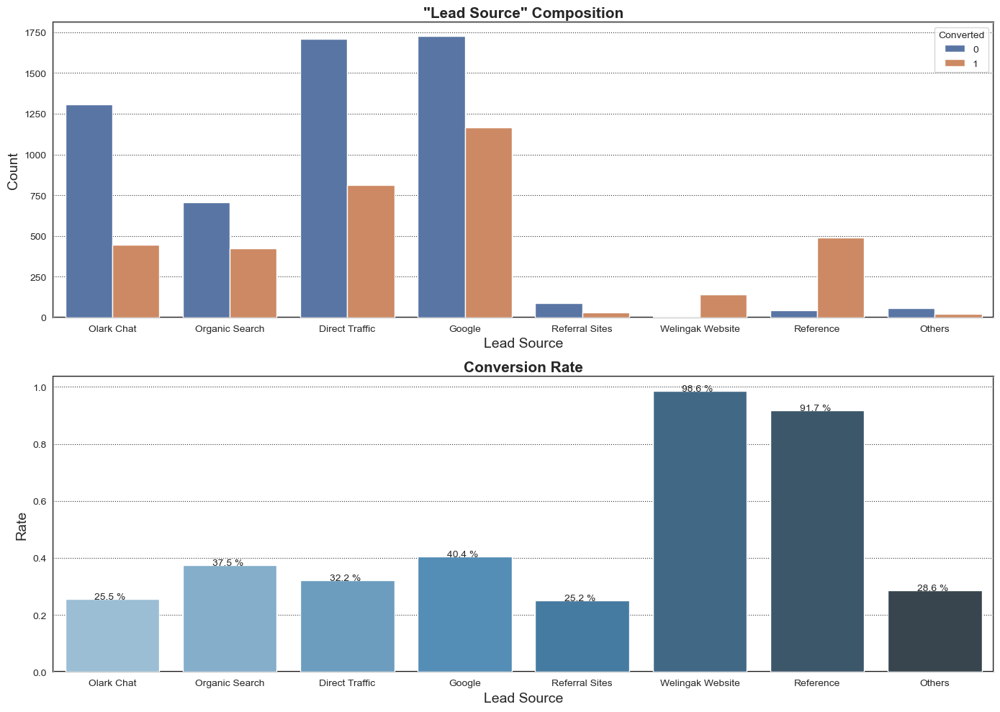

In [54]:
#Lead Source

plt.figure(figsize = [14,10])
plt.subplot(211)
hue_count('Lead Source', 'Converted')

# Rate of conversion
plt.subplot(212)
conversion_rate_plot('Lead Source', 'Converted', p = 'Blues_d')

plt.tight_layout()

-- Highest Number of leads come from Google and Direct Traffic. 

-- Conversion rate of leads from direct traffic is less than overall conversion rate and the same for Google (slightly more than overall average)

-- High percentage of leads from welingak website and References have converted. 

-- The company should invest more resources into acquiring leads from these sources.

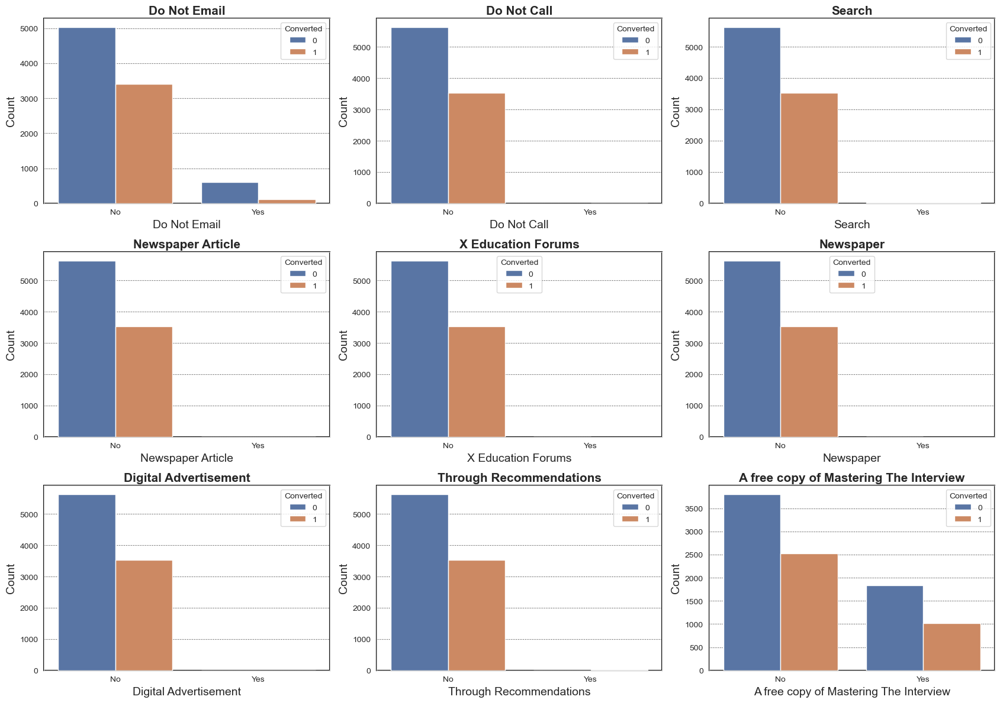

In [55]:
# visualizing binary catagorical variables

plt.figure(figsize = [17, 12])

for i in range(len(binary_cat_cols)):
    
    plt.subplot(3, 3, i+1)
    x, y = binary_cat_cols[i], 'Converted'
    ax = sns.countplot(leads[x], hue = leads[y], palette = 'deep')
    ax.set_title('{}'.format(x), fontsize = 15, fontweight = 'bold', pad = 5)
    ax.set_xlabel(x, fontsize = 14)
    ax.set_ylabel('Count', fontsize = 14)
    ax.patch.set_edgecolor('black')
    ax.patch.set_linewidth(1.5) 
    
plt.tight_layout()

-- It looks like for many of the variable here, one of the level is highly dominant and the other has almost no contribution. 

-- These variable are not useful for the model, so we can drop them.

In [56]:
for i in binary_cat_cols: 
    
    print('{}\n'.format(leads[i].value_counts()))

No     8448
Yes     719
Name: Do Not Email, dtype: int64

No     9165
Yes       2
Name: Do Not Call, dtype: int64

No     9153
Yes      14
Name: Search, dtype: int64

No     9165
Yes       2
Name: Newspaper Article, dtype: int64

No     9166
Yes       1
Name: X Education Forums, dtype: int64

No     9166
Yes       1
Name: Newspaper, dtype: int64

No     9163
Yes       4
Name: Digital Advertisement, dtype: int64

No     9160
Yes       7
Name: Through Recommendations, dtype: int64

No     6321
Yes    2846
Name: A free copy of Mastering The Interview, dtype: int64



In [57]:
cols_to_drop = ['Do Not Call',
                'Search',
                'Newspaper Article',
                'X Education Forums',
                'Newspaper',
                'Digital Advertisement',
                'Through Recommendations']

# updating the list of binary catagorical variables
binary_cat_cols = list(set(binary_cat_cols) - set(cols_to_drop))

cat_cols = list(set(cat_cols) - set(cols_to_drop))

# dropping the columns in cols_to_drop
leads.drop(cols_to_drop, axis = 1, inplace = True)

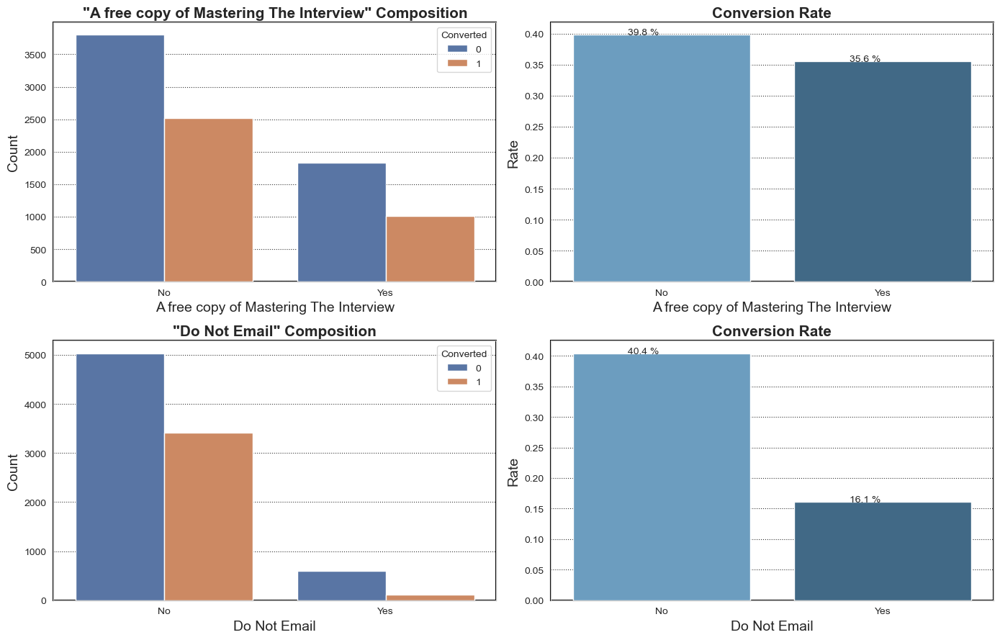

In [58]:
# visualizing binary catagorical variables - for better clarity after dropping:

plt.figure(figsize = [14, 9])

for i in range(len(binary_cat_cols)):
    plt.subplot(2, 2, 2*i+1)
    hue_count(binary_cat_cols[i], 'Converted')
    plt.subplot(2, 2, 2*i+2)
    conversion_rate_plot(binary_cat_cols[i], 'Converted', p = 'Blues_d')

plt.tight_layout()

-- Customers who selected to 'Do not get email' about course converted significantly more than those who selected to get emailed about course. This group can be targeted more.

-- Customers who did not want a copy of 'Mastering The Interview' had slightly more conversion rate

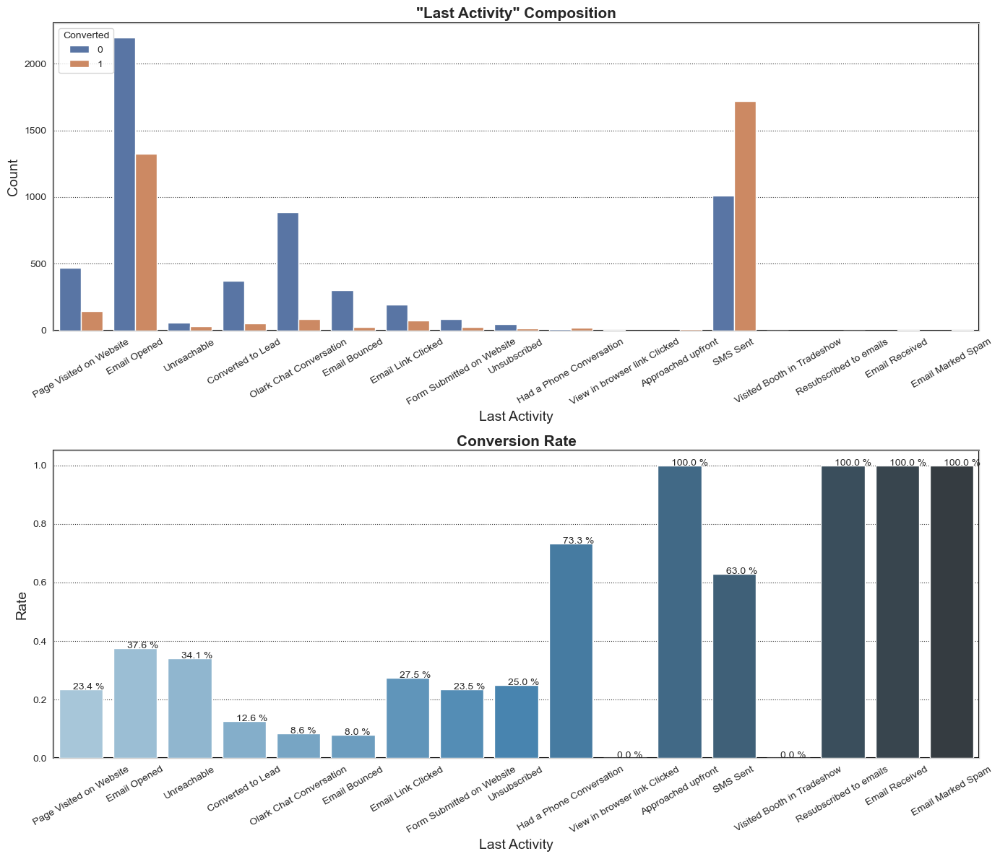

In [59]:
#Last Activity

plt.figure(figsize = [14,12])
plt.subplot(211)
hue_count('Last Activity', 'Converted')
plt.xticks(rotation = 30)

# Rate of conversion
plt.subplot(212)
conversion_rate_plot('Last Activity', 'Converted', p = 'Blues_d')
plt.xticks(rotation = 30)

plt.tight_layout()

In [60]:
#Specialization

leads['Specialization'].value_counts(normalize = True).mul(100).round(2)

Others                               36.74
Finance Management                   10.56
Human Resource Management             9.17
Marketing Management                  9.07
Operations Management                 5.48
Business Administration               4.34
IT Projects Management                3.96
Supply Chain Management               3.77
Banking, Investment And Insurance     3.64
Media and Advertising                 2.17
Travel and Tourism                    2.16
International Business                1.91
Healthcare Management                 1.71
Hospitality Management                1.23
E-COMMERCE                            1.21
Retail Management                     1.04
Rural and Agribusiness                0.77
E-Business                            0.62
Services Excellence                   0.44
Name: Specialization, dtype: float64

In [61]:
#combining less frequent levels into one, 'Others'

x = leads['Specialization'].value_counts(normalize = True).mul(100)
leads['Specialization'] = leads['Specialization'].replace(list(x[x < 2].index), 'Others')

leads['Specialization'].value_counts(normalize = True).mul(100).round(2)

Others                               45.67
Finance Management                   10.56
Human Resource Management             9.17
Marketing Management                  9.07
Operations Management                 5.48
Business Administration               4.34
IT Projects Management                3.96
Supply Chain Management               3.77
Banking, Investment And Insurance     3.64
Media and Advertising                 2.17
Travel and Tourism                    2.16
Name: Specialization, dtype: float64

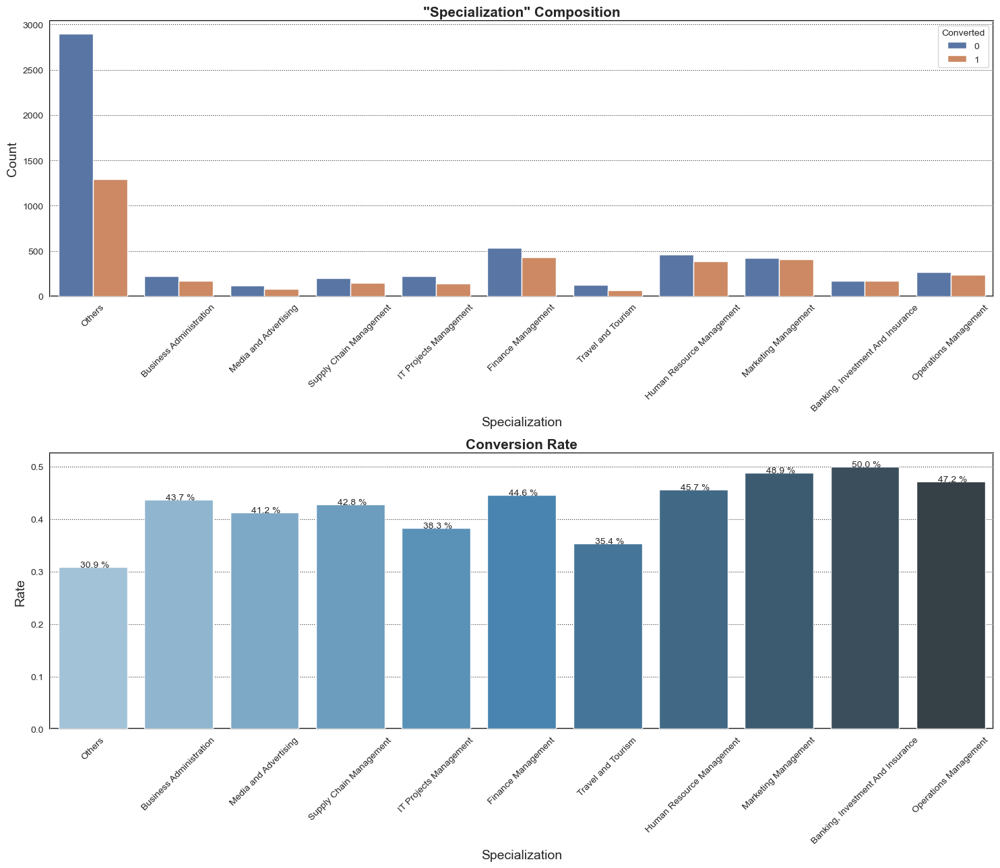

In [62]:
#Specialization

plt.figure(figsize = [15,13])
plt.subplot(211)
hue_count('Specialization', 'Converted')
plt.xticks(rotation = 45)

# Rate of conversion
plt.subplot(212)
conversion_rate_plot('Specialization', 'Converted', p = 'Blues_d')
plt.xticks(rotation = 45)

plt.tight_layout()

-- Leads from Management sector, like HR and Marketing Management, and Banking, Investment and Insurance specialization are relatively more likely to convert. 

-- Their average conversion rate is higher than the overall average. 

-- These groups can be targetted more

In [63]:
#Last Notable Activity

leads['Last Notable Activity'].value_counts(normalize = True).mul(100).round(2)

Modified                        36.93
Email Opened                    30.61
SMS Sent                        23.60
Page Visited on Website          3.28
Olark Chat Conversation          1.99
Email Link Clicked               1.87
Email Bounced                    0.65
Unsubscribed                     0.50
Unreachable                      0.35
Had a Phone Conversation         0.15
Email Marked Spam                0.02
Approached upfront               0.01
Resubscribed to emails           0.01
View in browser link Clicked     0.01
Form Submitted on Website        0.01
Email Received                   0.01
Name: Last Notable Activity, dtype: float64

In [64]:
#combining less frequent levels into one, 'Others'

x = leads['Last Notable Activity'].value_counts(normalize = True).mul(100)

leads['Last Notable Activity'] = leads['Last Notable Activity'].replace(list(x[x < 1].index), 'Others')

leads['Last Notable Activity'].value_counts(normalize = True).mul(100).round(2)

Modified                   36.93
Email Opened               30.61
SMS Sent                   23.60
Page Visited on Website     3.28
Olark Chat Conversation     1.99
Email Link Clicked          1.87
Others                      1.73
Name: Last Notable Activity, dtype: float64

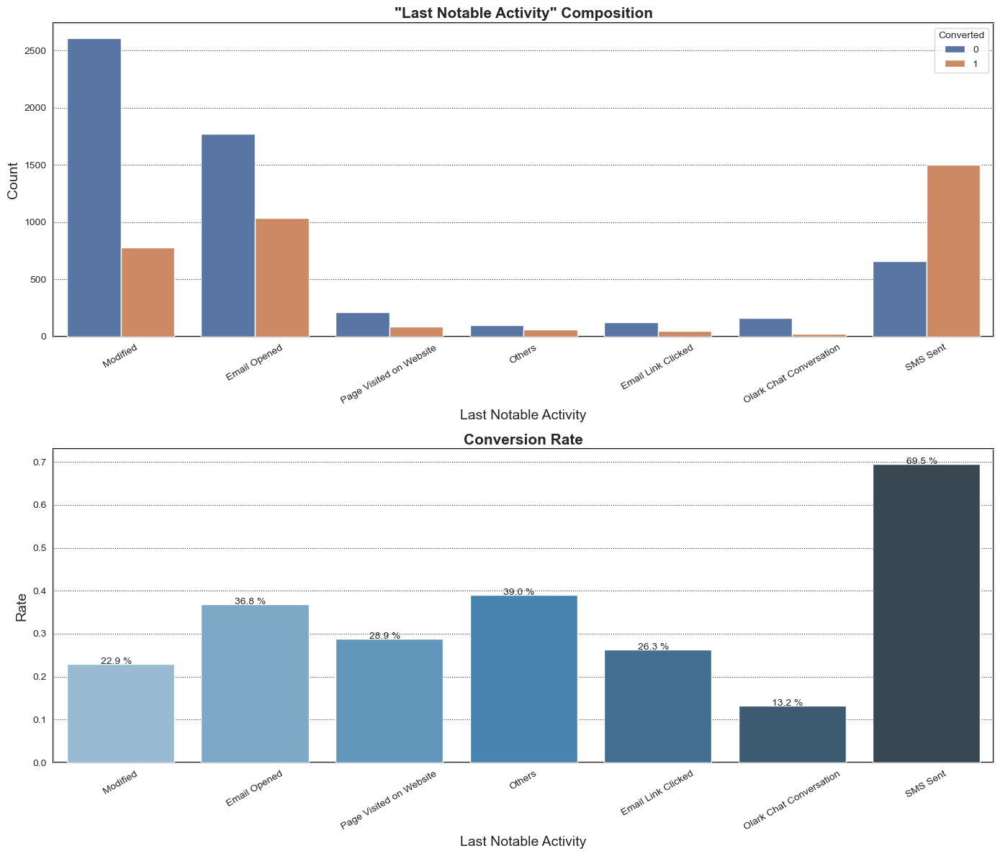

In [65]:
#Last Notable Activity

plt.figure(figsize = [14,12])
plt.subplot(211)
hue_count('Last Notable Activity', 'Converted')
plt.xticks(rotation = 30)

# Rate of conversion
plt.subplot(212)
conversion_rate_plot('Last Notable Activity', 'Converted', p = 'Blues_d')
plt.xticks(rotation = 30)

plt.tight_layout()


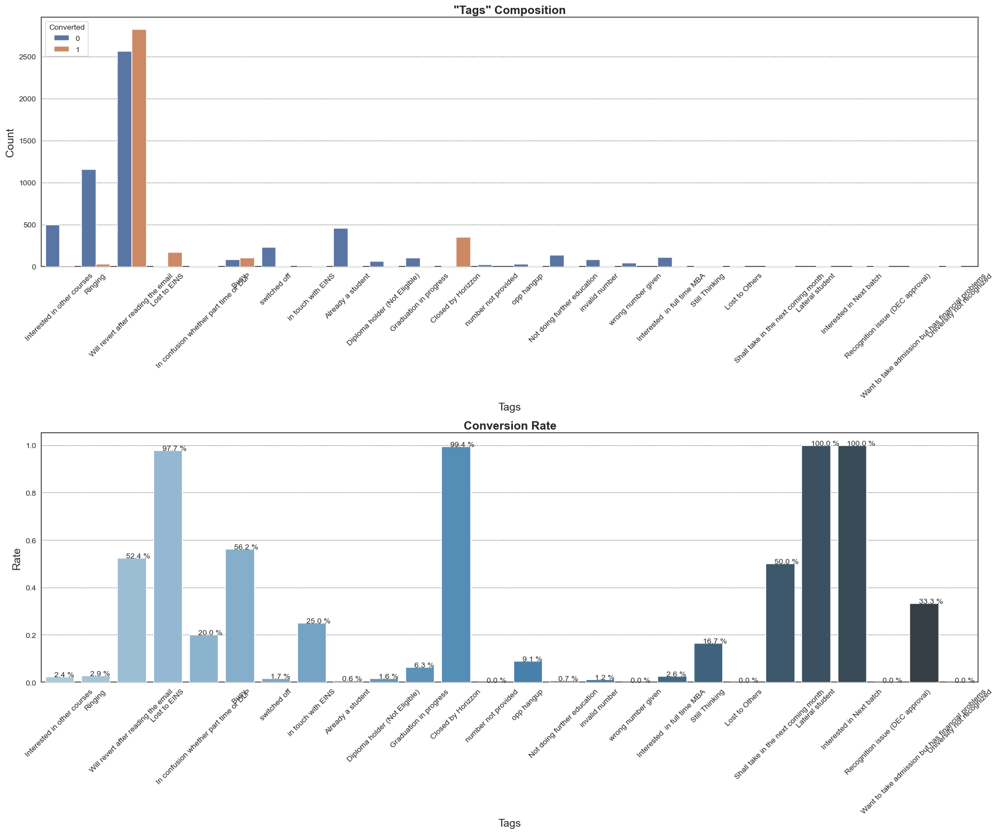

In [66]:
#Tags

plt.figure(figsize = [18,15])
plt.subplot(211)
hue_count('Tags', 'Converted')
plt.xticks(rotation = 45)


# Rate of conversion
plt.subplot(212)
conversion_rate_plot('Tags', 'Converted', p = 'Blues_d')
plt.xticks(rotation = 45)

plt.tight_layout()

-- Leads with tags/current status, 'Will revert after reading the email' have a very high likelyhood of converting. This group has high potential leads.

-- People with tags, 'Already a Student', 'Interested in other courses', 'Ringing' have very low conversion rate. Company should spend less resources on people in this group.

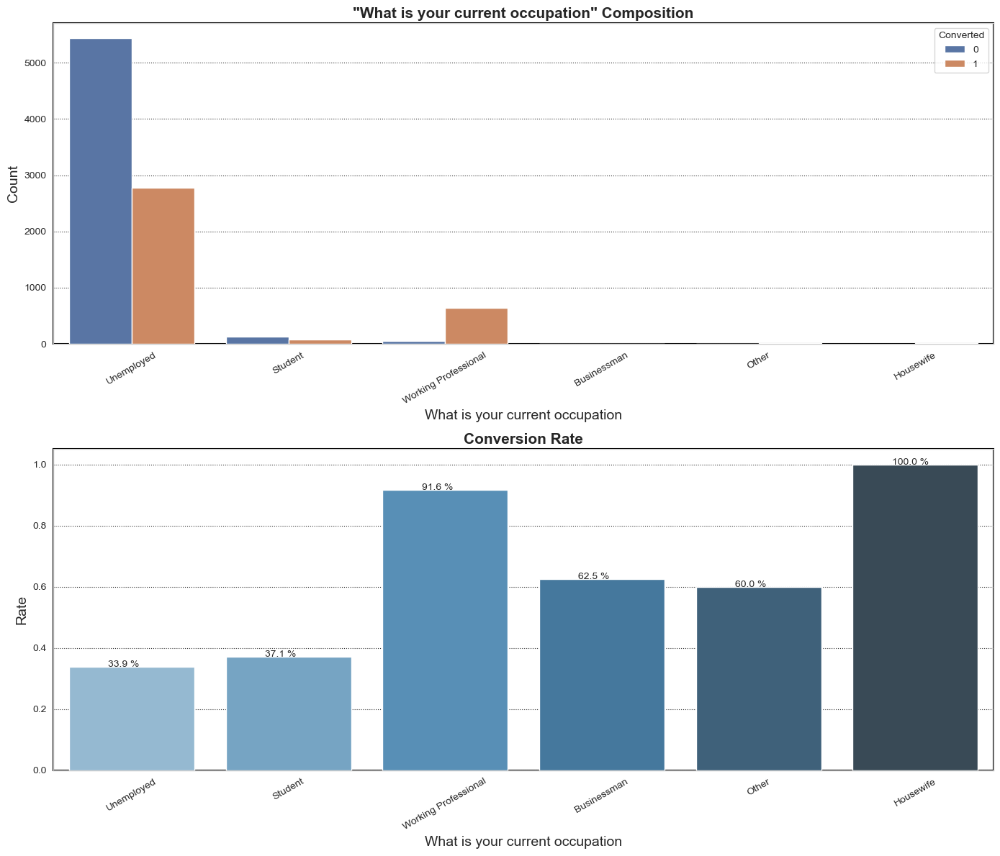

In [67]:
# What is your current occupation

plt.figure(figsize = [14,12])
plt.subplot(211)
hue_count('What is your current occupation', 'Converted')
plt.xticks(rotation = 30)

# Rate of conversion
plt.subplot(212)
conversion_rate_plot('What is your current occupation', 'Converted', p = 'Blues_d')
plt.xticks(rotation = 30)

plt.tight_layout()

-- Unemployed people are least likely to convert. Working professionals have a very high conversion rate. They should be targetted more.

-- Housewives have a 100% conversion rate but the data for housewives is too small to make conclusive decision

In [68]:
leads[cat_cols].nunique().sum()

83

### Analysing Numerical Variables

<Figure size 1800x1600 with 0 Axes>

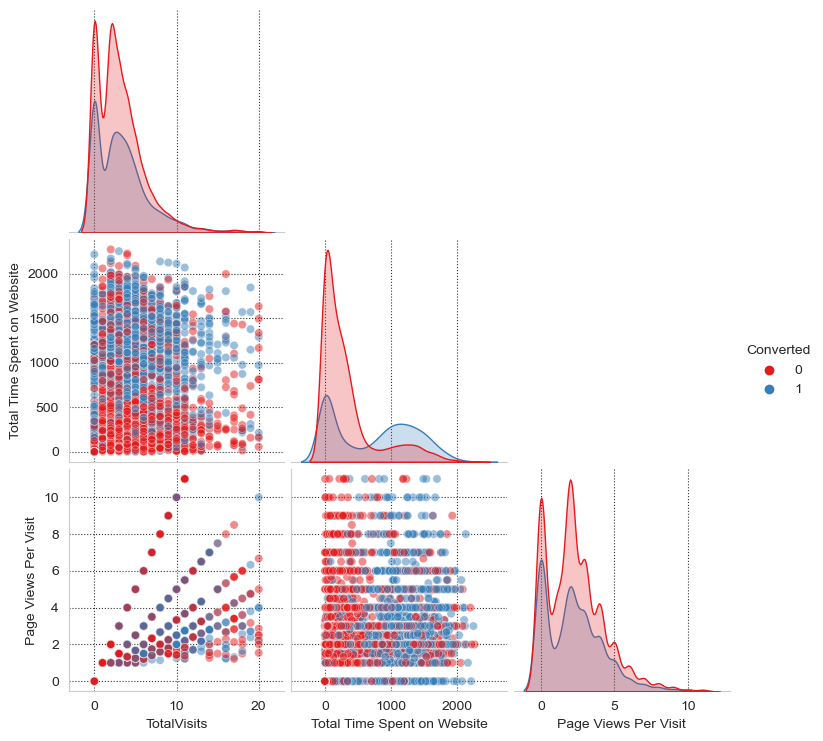

In [69]:
num_cols = ['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit']

plt.figure(figsize = [18,16])

cols = ['Converted']

cols.extend(num_cols)

sns.pairplot(leads[cols], hue = 'Converted', corner = True, plot_kws = {'alpha': 0.5}, palette = 'Set1')

plt.show()

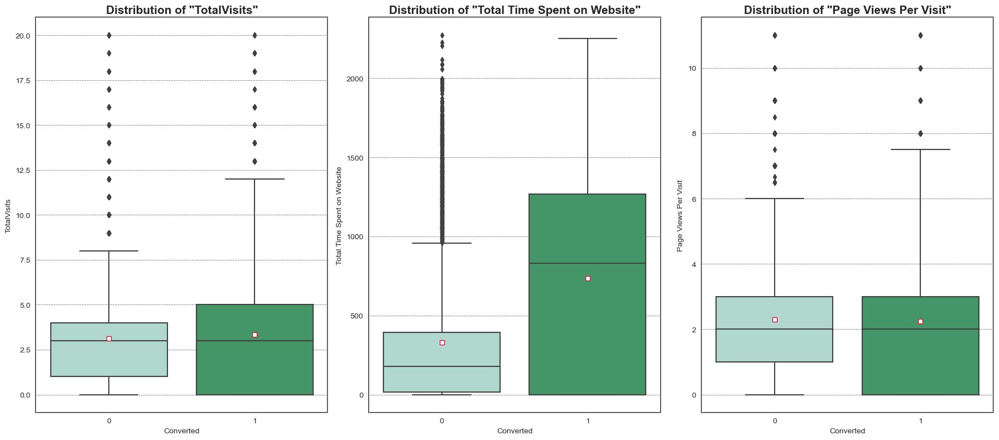

In [70]:
# Distribution of numerical variables with respect to target

plt.figure(figsize = [18,8])

for i in range(len(num_cols)):
    
    plt.subplot(1, 3, i+1)
    box_plot2('Converted', num_cols[i], p = 'BuGn')
    
plt.tight_layout()

Outcomes from Numerical analysis:
    
-- Average and median total number of visits made by the leads is almost the same. 

-- The average and median total number of page views per visit is also almost the same. 

-- The values are more spread out for the leads that converted.

-- Leads that spend more time on the website are more likely to convert. These people show be approcahed more. Also, websites can be made more engaging and user-friendly to improve the numbers.

### Binning:

In [71]:
# categorical features

cat_cols = [col for col in leads.select_dtypes(exclude = np.number).columns]

cat_cols

['Lead Origin',
 'Lead Source',
 'Do Not Email',
 'Last Activity',
 'Specialization',
 'What is your current occupation',
 'Tags',
 'A free copy of Mastering The Interview',
 'Last Notable Activity']

In [72]:
#binary catagorical features

binary_cat_cols

['A free copy of Mastering The Interview', 'Do Not Email']

In [73]:
# Defining the map function

def binary_map(x):
    return x.map({'Yes': 1, "No": 0})

# Applying the function to the housing list
leads[binary_cat_cols] = leads[binary_cat_cols].apply(binary_map)

In [74]:
leads.head()

,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,Tags,A free copy of Mastering The Interview,Last Notable Activity
0,API,Olark Chat,0,0,0.0,0,0.0,Page Visited on Website,Others,Unemployed,Interested in other courses,0,Modified
1,API,Organic Search,0,0,5.0,674,2.5,Email Opened,Others,Unemployed,Ringing,0,Email Opened
2,Landing Page Submission,Direct Traffic,0,1,2.0,1532,2.0,Email Opened,Business Administration,Student,Will revert after reading the email,1,Email Opened
3,Landing Page Submission,Direct Traffic,0,0,1.0,305,1.0,Unreachable,Media and Advertising,Unemployed,Ringing,0,Modified
4,Landing Page Submission,Google,0,1,2.0,1428,1.0,Converted to Lead,Others,Unemployed,Will revert after reading the email,0,Modified


After creating bins we removed the outliers and are now good to go. Before creating the dummy variables let's remove redundant columns/varaibles.

Also from above we know columns : 'Last Activity', 'Tags', 'Last Notable Activity' activity columns came from sales team, thus we will drop these redundant columns.

#### Categorical to numerical data conversion using dummy variables:

In [75]:
# Creating a dummy variables for 4 categories and dropping the first level. 

cat = ['Lead Origin', 'Lead Source','Specialization','What is your current occupation',
       'Last Activity', 'Tags', 'Last Notable Activity']

# creating dummy variables data set
dummy = pd.get_dummies(leads[cat], drop_first=True)

# Adding these dummies to our original dataset
leads = pd.concat([leads,dummy],axis=1)

# Dropping the duplicate columns
leads = leads.drop(cat, axis=1)

# viewing the dataset
leads.head()

,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Specialization_Business Administration,Specialization_Finance Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Others,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Marked Spam,Last Activity_Email Opened,Last Activity_Email Received,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Resubscribed to emails,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Last Activity_View in browser link Clicked,Last Activity_Visited Booth in Tradeshow,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,Last Notable Activity_Email Opened,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Others,Last Notable Activity_Page Visited on Website,Last Notable Activity_SMS Sent
0,0,0,0.0,0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,0,0,5.0,674,2.5,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,0,1,2.0,1532,2.0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
3,0,0,1.0,305,1.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4,0,1,2.0,1428,1.0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0


### Data Preparation

Split the dataset into train and test dataset and scaled the datasets

After this, we plot a heatmap to check the correlations among the variables

check heatmap for highly correlated features

In [77]:
# Importing train-test-split method from sklearn - model selection

from sklearn.model_selection import train_test_split

In [78]:
# putting feature varibales in "X" and target variable in "y" 

y= leads['Converted'] 
X= leads.drop('Converted',1)

y.head()

0    0
1    0
2    1
3    0
4    1
Name: Converted, dtype: int64

In [79]:
## Checking the conversion rate from 'converted' column as it denotes the target variable

print('Current Conversion Rate:',round((sum(y)/len(y.index))*100,2))

Current Conversion Rate: 38.52


In [80]:
X.head()

,Do Not Email,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Specialization_Business Administration,Specialization_Finance Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Others,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Marked Spam,Last Activity_Email Opened,Last Activity_Email Received,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Resubscribed to emails,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Last Activity_View in browser link Clicked,Last Activity_Visited Booth in Tradeshow,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,Last Notable Activity_Email Opened,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Others,Last Notable Activity_Page Visited on Website,Last Notable Activity_SMS Sent
0,0,0.0,0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,0,5.0,674,2.5,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,0,2.0,1532,2.0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
3,0,1.0,305,1.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4,0,2.0,1428,1.0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0


In [81]:
# Splitting the datset into train and test dataset

X_train,X_test,y_train,y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [82]:
# X, y train and test sets

print('X_train:',X_train.shape)
print('X_test:',X_test.shape)
print('y_train:',y_train.shape)
print('y_test:',y_test.shape)

X_train: (6416, 77)
X_test: (2751, 77)
y_train: (6416,)
y_test: (2751,)


### Feature Scaling:

In [83]:
# Importing Standard Scaler method from sklearn - preprocessing library

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()  # Creating an object

In [84]:
# numerical features

num_cols = ['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit']

In [85]:
# fitting scaler and transforming X_train
X_train[num_cols] = scaler.fit_transform(X_train[num_cols])

# Transforming X_test
X_test[num_cols] = scaler.transform(X_test[num_cols])

In [86]:
X_train[num_cols].agg([np.mean, np.std]).round(2)

,TotalVisits,Total Time Spent on Website,Page Views Per Visit
mean,-0.0,0.0,0.0
std,1.0,1.0,1.0


In [87]:
X_test[num_cols].agg([np.mean, np.std]).round(2)

,TotalVisits,Total Time Spent on Website,Page Views Per Visit
mean,-0.06,-0.01,-0.06
std,0.94,1.00,0.96


### Correlation in the dataset

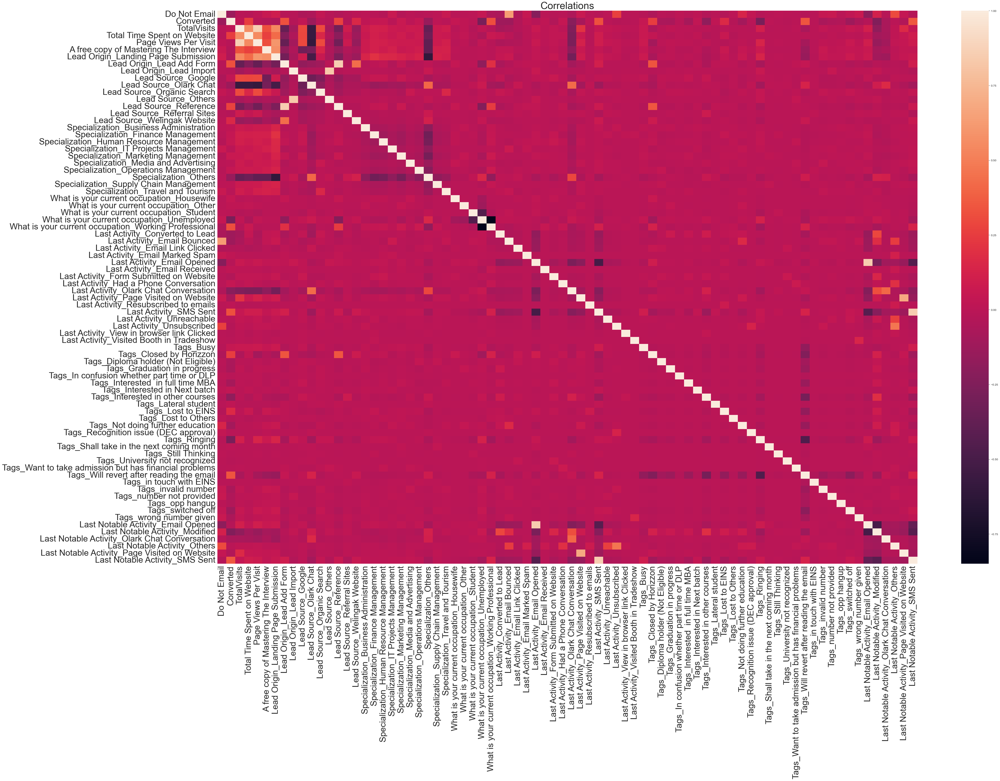

In [88]:
# setting the figure size
plt.figure(figsize=(55,35))

# Plotting a heatmap

sns.heatmap(leads.corr(method='spearman'))
plt.title('Correlations', fontsize =35)
plt.yticks(fontsize=30)
plt.xticks(fontsize=30)
plt.show()

As observed, there are high correlations between some of the varibles and therefore, data has multicollinearity.

### MODEL-BUILDING:

In [89]:
# Importing RFE and logistic regression libraries from scikit learn

from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE

# creating an object

logreg = LogisticRegression()

In [90]:
rfe = RFE(estimator= logreg)

# Specify the number of features to select using the 'n_features_to_select' attribute
rfe.n_features_to_select = 15

# Fit the RFE model on the training data
rfe.fit(X_train, y_train)

RFE(estimator=LogisticRegression(), n_features_to_select=15)

In [91]:
#listing which all columns are selected(True) by RFE and which all are rejected(False)

list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('Do Not Email', True, 1),
 ('TotalVisits', False, 44),
 ('Total Time Spent on Website', False, 8),
 ('Page Views Per Visit', False, 47),
 ('A free copy of Mastering The Interview', False, 40),
 ('Lead Origin_Landing Page Submission', False, 13),
 ('Lead Origin_Lead Add Form', True, 1),
 ('Lead Origin_Lead Import', False, 21),
 ('Lead Source_Google', False, 54),
 ('Lead Source_Olark Chat', False, 22),
 ('Lead Source_Organic Search', False, 39),
 ('Lead Source_Others', False, 35),
 ('Lead Source_Reference', False, 33),
 ('Lead Source_Referral Sites', False, 45),
 ('Lead Source_Welingak Website', False, 3),
 ('Specialization_Business Administration', False, 49),
 ('Specialization_Finance Management', False, 50),
 ('Specialization_Human Resource Management', False, 53),
 ('Specialization_IT Projects Management', False, 57),
 ('Specialization_Marketing Management', False, 42),
 ('Specialization_Media and Advertising', False, 58),
 ('Specialization_Operations Management', False, 56),
 ('Sp

In [92]:
# storing selected(True) columns by RFE in a list
rfe_col = X_train.columns[rfe.support_]

# listing features removed by RFE feature selection
X_train.columns[~rfe.support_]

Index(['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit',
       'A free copy of Mastering The Interview',
       'Lead Origin_Landing Page Submission', 'Lead Origin_Lead Import',
       'Lead Source_Google', 'Lead Source_Olark Chat',
       'Lead Source_Organic Search', 'Lead Source_Others',
       'Lead Source_Reference', 'Lead Source_Referral Sites',
       'Lead Source_Welingak Website',
       'Specialization_Business Administration',
       'Specialization_Finance Management',
       'Specialization_Human Resource Management',
       'Specialization_IT Projects Management',
       'Specialization_Marketing Management',
       'Specialization_Media and Advertising',
       'Specialization_Operations Management', 'Specialization_Others',
       'Specialization_Supply Chain Management',
       'Specialization_Travel and Tourism',
       'What is your current occupation_Housewife',
       'What is your current occupation_Other',
       'What is your current occupat

#### RFE (coarse tuning)

Recursive feature elimination reduces model complexity by removing features one by one until the optimal number of features is left. This is achieved by fitting the given machine learning algorithm used in the core of the model,ranking features by importance, discarding the least important features, and re-fitting the model.

In [93]:
# Creating new train dataframe with RFE selected features

X_train_rfe = X_train[rfe_col]
X_train_rfe.head()

,Do Not Email,Lead Origin_Lead Add Form,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Last Activity_Had a Phone Conversation,Tags_Busy,Tags_Closed by Horizzon,Tags_Interested in Next batch,Tags_Lost to EINS,Tags_Ringing,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_switched off,Last Notable Activity_SMS Sent
1769,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
9206,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
6350,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
506,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
6990,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1


In [94]:
# creating 1st model

# Adding a constant
X_train_1 = sm.add_constant(X_train_rfe)

# creating a model and fitting it.

logr1= sm.GLM(y_train,X_train_1,family=sm.families.Binomial()).fit()   # Using GLM for creating model and fitting it

logr1.summary()        

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6416
Model:                            GLM   Df Residuals:                     6400
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2094.5
Date:                Sat, 14 Oct 2023   Deviance:                       4189.0
Time:                        14:21:37   Pearson chi2:                 1.08e+04
No. Iterations:                    20   Pseudo R-squ. (CS):             0.4906
Covariance Type:            nonrobust                                         
==========================================================================================================================
                                                             coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------
const                                                     -2.8160      0.308     -9.156      0.000      -3.419      -2.213
Do Not Email                                              -1.5377      0.180     -8.547      0.000      -1.890      -1.185
Lead Origin_Lead Add Form                                  2.7612      0.225     12.265      0.000       2.320       3.202
What is your current occupation_Unemployed                -1.8160      0.278     -6.544      0.000      -2.360      -1.272
What is your current occupation_Working Professional       1.3603      0.356      3.825      0.000       0.663       2.057
Last Activity_Had a Phone Conversation                     2.3125      0.775      2.984      0.003       0.794       3.831
Tags_Busy                                                  3.9781      0.310     12.851      0.000       3.371       4.585
Tags_Closed by Horizzon                                    8.4441      0.748     11.285      0.000       6.978       9.911
Tags_Interested in Next batch                             23.8412   1.32e+04      0.002      0.999   -2.58e+04    2.58e+04
Tags_Lost to EINS                                          8.5233      0.751     11.354      0.000       7.052       9.995
Tags_Ringing                                              -0.7588      0.319     -2.377      0.017      -1.384      -0.133
Tags_Want to take admission but has financial problems     3.3706      1.248      2.700      0.007       0.924       5.817
Tags_Will revert after reading the email                   3.8547      0.224     17.203      0.000       3.416       4.294
Tags_in touch with EINS                                    3.3792      0.833      4.059      0.000       1.747       5.011
Tags_switched off                                         -0.6730      0.563     -1.195      0.232      -1.777       0.431
Last Notable Activity_SMS Sent                             2.6658      0.109     24.558      0.000       2.453       2.879
==========================================================================================================================
"""

#### Some of the variables has high P-value > 0.05 : 'Tags_Interested in Next batch' & 'Tags_switched off'. Let us also check VIF of our 1st model

In [95]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Creating vif dataframe

vif=pd.DataFrame()

# adding same features as the x_train dataset have

vif['Features']=X_train_rfe[rfe_col].columns  

# Caculating VIFs

vif['VIF']=[variance_inflation_factor(X_train_rfe[rfe_col].values,i) for i in range(X_train_rfe[rfe_col].shape[1])]

# Rounding the vif values

vif['VIF']=round(vif['VIF'],2)

# Sorting the vif values

vif=vif.sort_values(by='VIF',ascending=False)
vif   # Viewing the dataset

,Features,VIF
2,What is your current occupation_Unemployed,5.10
11,Tags_Will revert after reading the email,4.31
9,Tags_Ringing,1.79
3,What is your current occupation_Working Profes...,1.53
14,Last Notable Activity_SMS Sent,1.46
6,Tags_Closed by Horizzon,1.39
1,Lead Origin_Lead Add Form,1.30
13,Tags_switched off,1.15
5,Tags_Busy,1.13
8,Tags_Lost to EINS,1.11


#### VIF is also slightly higher - let us drop the const and analyze the variables for statistical significance and Correlation (Multi-collinearity)

In [96]:
# Dropping the constant - to avoid confusion and to analyze further!

X_train_rfe2 = X_train_1.drop(['const'],1)

# Creating our 2nd model:

X_train_2=sm.add_constant(X_train_rfe2)                                 # Adding constant
logr2 = sm.GLM(y_train,X_train_2,family=sm.families.Binomial()).fit()     # Using GLM for creating model and fitting it

logr2.summary()    

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6416
Model:                            GLM   Df Residuals:                     6400
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2094.5
Date:                Sat, 14 Oct 2023   Deviance:                       4189.0
Time:                        14:22:09   Pearson chi2:                 1.08e+04
No. Iterations:                    20   Pseudo R-squ. (CS):             0.4906
Covariance Type:            nonrobust                                         
==========================================================================================================================
                                                             coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------
const                                                     -2.8160      0.308     -9.156      0.000      -3.419      -2.213
Do Not Email                                              -1.5377      0.180     -8.547      0.000      -1.890      -1.185
Lead Origin_Lead Add Form                                  2.7612      0.225     12.265      0.000       2.320       3.202
What is your current occupation_Unemployed                -1.8160      0.278     -6.544      0.000      -2.360      -1.272
What is your current occupation_Working Professional       1.3603      0.356      3.825      0.000       0.663       2.057
Last Activity_Had a Phone Conversation                     2.3125      0.775      2.984      0.003       0.794       3.831
Tags_Busy                                                  3.9781      0.310     12.851      0.000       3.371       4.585
Tags_Closed by Horizzon                                    8.4441      0.748     11.285      0.000       6.978       9.911
Tags_Interested in Next batch                             23.8412   1.32e+04      0.002      0.999   -2.58e+04    2.58e+04
Tags_Lost to EINS                                          8.5233      0.751     11.354      0.000       7.052       9.995
Tags_Ringing                                              -0.7588      0.319     -2.377      0.017      -1.384      -0.133
Tags_Want to take admission but has financial problems     3.3706      1.248      2.700      0.007       0.924       5.817
Tags_Will revert after reading the email                   3.8547      0.224     17.203      0.000       3.416       4.294
Tags_in touch with EINS                                    3.3792      0.833      4.059      0.000       1.747       5.011
Tags_switched off                                         -0.6730      0.563     -1.195      0.232      -1.777       0.431
Last Notable Activity_SMS Sent                             2.6658      0.109     24.558      0.000       2.453       2.879
==========================================================================================================================
"""

In [97]:
# Check for the VIF values of the feature variables. 

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif=pd.DataFrame()
vif['Features']=X_train_rfe2.columns  
vif['VIF']=[variance_inflation_factor(X_train_rfe2.values,i) for i in range(X_train_rfe2.shape[1])]
vif['VIF']=round(vif['VIF'],2)
vif=vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
2,What is your current occupation_Unemployed,5.10
11,Tags_Will revert after reading the email,4.31
9,Tags_Ringing,1.79
3,What is your current occupation_Working Profes...,1.53
14,Last Notable Activity_SMS Sent,1.46
6,Tags_Closed by Horizzon,1.39
1,Lead Origin_Lead Add Form,1.30
13,Tags_switched off,1.15
5,Tags_Busy,1.13
8,Tags_Lost to EINS,1.11


#### In the next steps -  will drop the variables that shows P-value > 0.05

#### Dropping: 'Tags_Interested in Next batch' since it's highly insignificant 

In [98]:
# Dropping the most insignificant values 'Tags_Interested in Next batch'

X_train_rfe3 = X_train_2.drop(['Tags_Interested in Next batch'],1)

# Creating 3rd - new model

X_train_3 = sm.add_constant(X_train_rfe3)                                 # Adding constant
logr3= sm.GLM(y_train,X_train_3,family=sm.families.Binomial()).fit()     # Using GLM for creating model and fitting it

logr3.summary()          

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6416
Model:                            GLM   Df Residuals:                     6401
Model Family:                Binomial   Df Model:                           14
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2102.3
Date:                Sat, 14 Oct 2023   Deviance:                       4204.7
Time:                        14:22:32   Pearson chi2:                 1.07e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.4893
Covariance Type:            nonrobust                                         
==========================================================================================================================
                                                             coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------
const                                                     -2.7290      0.298     -9.157      0.000      -3.313      -2.145
Do Not Email                                              -1.5111      0.179     -8.451      0.000      -1.861      -1.161
Lead Origin_Lead Add Form                                  2.7645      0.224     12.326      0.000       2.325       3.204
What is your current occupation_Unemployed                -1.7722      0.273     -6.501      0.000      -2.306      -1.238
What is your current occupation_Working Professional       1.3753      0.350      3.928      0.000       0.689       2.062
Last Activity_Had a Phone Conversation                     2.3162      0.775      2.988      0.003       0.797       3.835
Tags_Busy                                                  3.8371      0.301     12.758      0.000       3.248       4.427
Tags_Closed by Horizzon                                    8.3137      0.745     11.166      0.000       6.854       9.773
Tags_Lost to EINS                                          8.3904      0.747     11.234      0.000       6.927       9.854
Tags_Ringing                                              -0.9095      0.310     -2.932      0.003      -1.518      -0.301
Tags_Want to take admission but has financial problems     3.2380      1.247      2.598      0.009       0.795       5.681
Tags_Will revert after reading the email                   3.7204      0.211     17.592      0.000       3.306       4.135
Tags_in touch with EINS                                    3.2484      0.829      3.917      0.000       1.623       4.874
Tags_switched off                                         -0.8234      0.558     -1.475      0.140      -1.917       0.270
Last Notable Activity_SMS Sent                             2.6891      0.109     24.731      0.000       2.476       2.902
==========================================================================================================================
"""

####  P-values of most of the variables after model-3 is statistically significant. However, Tags_switched off has hgher p-value > 0.05 ; hence we can drop it in our 4th-model


In [99]:
# Check for the VIF values of the feature variables. 

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif=pd.DataFrame()
vif['Features']=X_train_rfe3.columns  
vif['VIF']=[variance_inflation_factor(X_train_rfe3.values,i) for i in range(X_train_rfe3.shape[1])]
vif['VIF']=round(vif['VIF'],2)
vif=vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
0,const,39.38
4,What is your current occupation_Working Profes...,3.68
3,What is your current occupation_Unemployed,3.61
11,Tags_Will revert after reading the email,1.88
9,Tags_Ringing,1.58
7,Tags_Closed by Horizzon,1.35
2,Lead Origin_Lead Add Form,1.20
13,Tags_switched off,1.13
6,Tags_Busy,1.12
14,Last Notable Activity_SMS Sent,1.12


#### VIF values less than 5, it suggests that there is no strong multicollinearity among the independent variables in regression model. This is a good sign because high multicollinearity can make it challenging to interpret the impact of individual predictors.

In [100]:
# Dropping the most insignificant values 'Tags_switched off' and constant

X_train_rfe4 = X_train_3.drop(['const','Tags_switched off'],1)

# Creating 4th - new model 

X_train_4 = sm.add_constant(X_train_rfe4)                                 # Adding constant

logr4=sm.GLM(y_train,X_train_4,family=sm.families.Binomial()).fit()     # Using GLM for creating model and fitting it

logr4.summary()    

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6416
Model:                            GLM   Df Residuals:                     6402
Model Family:                Binomial   Df Model:                           13
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2103.6
Date:                Sat, 14 Oct 2023   Deviance:                       4207.2
Time:                        14:22:57   Pearson chi2:                 1.03e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.4891
Covariance Type:            nonrobust                                         
==========================================================================================================================
                                                             coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------
const                                                     -2.8324      0.299     -9.482      0.000      -3.418      -2.247
Do Not Email                                              -1.5141      0.179     -8.474      0.000      -1.864      -1.164
Lead Origin_Lead Add Form                                  2.7735      0.225     12.346      0.000       2.333       3.214
What is your current occupation_Unemployed                -1.8150      0.276     -6.585      0.000      -2.355      -1.275
What is your current occupation_Working Professional       1.3588      0.355      3.825      0.000       0.663       2.055
Last Activity_Had a Phone Conversation                     2.3144      0.775      2.987      0.003       0.796       3.833
Tags_Busy                                                  3.9907      0.289     13.790      0.000       3.423       4.558
Tags_Closed by Horizzon                                    8.4588      0.741     11.416      0.000       7.007       9.911
Tags_Lost to EINS                                          8.5367      0.743     11.486      0.000       7.080       9.993
Tags_Ringing                                              -0.7481      0.297     -2.516      0.012      -1.331      -0.165
Tags_Want to take admission but has financial problems     3.3828      1.245      2.717      0.007       0.943       5.823
Tags_Will revert after reading the email                   3.8682      0.197     19.596      0.000       3.481       4.255
Tags_in touch with EINS                                    3.3947      0.826      4.110      0.000       1.776       5.013
Last Notable Activity_SMS Sent                             2.6687      0.107     24.845      0.000       2.458       2.879
==========================================================================================================================
"""

In [101]:
# Check for the VIF values of the feature variables. 

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif=pd.DataFrame()
vif['Features']=X_train_rfe4.columns  
vif['VIF']=[variance_inflation_factor(X_train_rfe4.values,i) for i in range(X_train_rfe4.shape[1])]
vif['VIF']=round(vif['VIF'],2)
vif=vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
2,What is your current occupation_Unemployed,4.54
10,Tags_Will revert after reading the email,3.89
8,Tags_Ringing,1.69
3,What is your current occupation_Working Profes...,1.50
12,Last Notable Activity_SMS Sent,1.44
6,Tags_Closed by Horizzon,1.37
1,Lead Origin_Lead Add Form,1.30
5,Tags_Busy,1.12
0,Do Not Email,1.10
7,Tags_Lost to EINS,1.10


### 4th Model = Final-Model:

-- P-value of all the predictor variables are less than < 0.05 ; indicates - statistically significant

-- VIF of all variables less than 5; No strong correlation or multicollineraity among predictor variables

-- Hence, we can consider this as our final trained model

### Prediction - Train set:

In [102]:
#predicting train dataset with final model

y_train_pred = logr4.predict(X_train_4)

# Creating a new dataset and saving predicted values in it

y_train_pred_final = pd.DataFrame({'Converted':y_train.values,'Converted_probability':y_train_pred,'ID':y_train.index})

y_train_pred_final.head()   # viewing first 5 rows

,Converted,Converted_probability,ID
1769,0,0.314497,1769
9206,0,0.004516,9206
6350,0,0.314497,6350
506,0,0.314497,506
6990,1,0.868696,6990


### ROC Curve Plotting:

-- ROC curve shows the trade off between True postive rate and False positive rate - means if sensitivity increases specificity will decrease

-- The curve closer to the left side border then right side of the border is more accurate

-- The curve closer to the 45-degree diagonal of the ROC space is less accurate

In [103]:
# Importing necessary libraries for roc curve

from sklearn.metrics import roc_curve       
from sklearn.metrics import roc_auc_score

# Creating a function to plot roc curve with auc score

def draw_roc(actual, probability):
    
    # Creating roc curve to get true positive rate, false positive rate and threshold
    
    fpr, tpr, thresholds = roc_curve( actual, probability,drop_intermediate = False )   
    
    # Calculating the auc score(area under the curve)
    
    auc_score = roc_auc_score( actual, probability )    
    
    # Setting the figure size
    
    plt.figure(figsize=(15,10))
    
    # Plotting the roc curve
    
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    
    # Plotting the 45% dotted line 
    plt.plot([0, 1], [0, 1], 'r--')
    
    # Setting the x axis limit
    
    plt.xlim([0.0, 1.0])
    
    # Setting the y axis limit
    
    plt.ylim([0.0, 1.05])
    
    # Setting the x axis label
    plt.xlabel('False Positive Rate')
    
    # Setting the y axis label
    
    plt.ylabel('True Positive Rate')
    
    # Setting the title
    
    plt.title('Receiver operating characteristic')
    
    # Setting the legend on the left below to show the value of auc    
    
    plt.legend(loc="lower right")
    
    # Showing the plot
    
    plt.show()

    return None   # no return

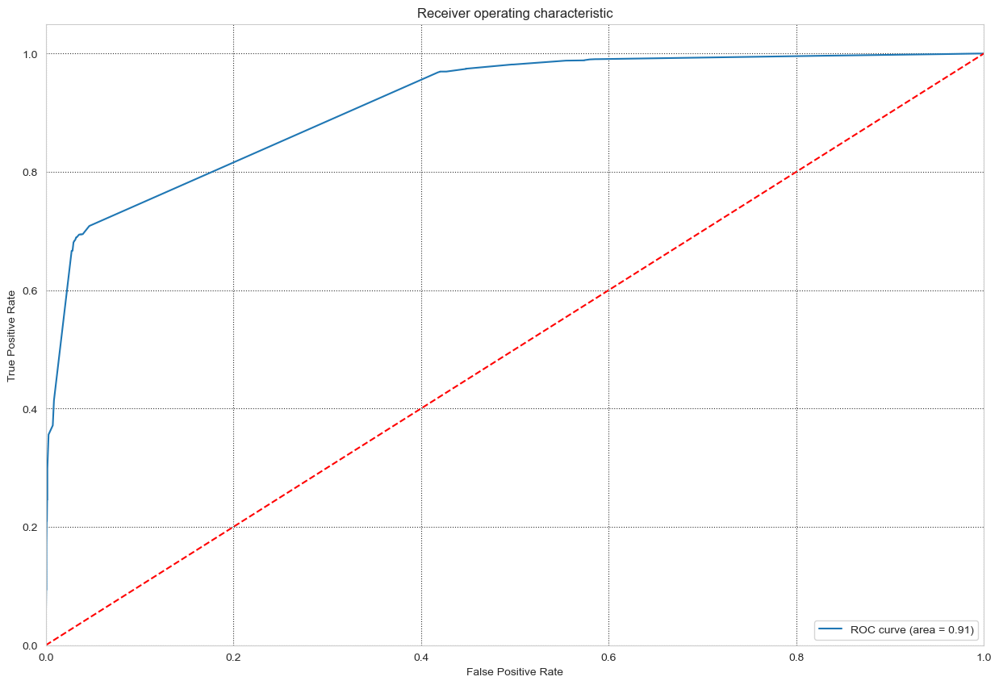

In [104]:
# ROC curve function for plotting

draw_roc(y_train_pred_final.Converted, y_train_pred_final.Converted_probability)

In [105]:
# creating 10 points of probabilities to find the optimal point cutoff

numbers=[float(x)/10 for x in range(10)]  # from 0 to 0.9 with set size 0.1

for i in numbers:
    y_train_pred_final[i]=y_train_pred_final['Converted_probability'].map(lambda x:1 if x > i else 0)   #  Mapping the probablities for each 10 points

y_train_pred_final.head()   # Viewing the first 5 rows

,Converted,Converted_probability,ID,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
1769,0,0.314497,1769,1,1,1,1,0,0,0,0,0,0
9206,0,0.004516,9206,1,0,0,0,0,0,0,0,0,0
6350,0,0.314497,6350,1,1,1,1,0,0,0,0,0,0
506,0,0.314497,506,1,1,1,1,0,0,0,0,0,0
6990,1,0.868696,6990,1,1,1,1,1,1,1,1,1,0


In [106]:
# Calculating Accuracy, sensitivity and specificity with probability cutoffs

from sklearn.metrics import confusion_matrix

# Creating a dataframe to store all the values to be created

df_cutoffs=pd.DataFrame(columns=['Probability','Accuracy','Sensitvity','Specificity'])

# from 0 to 0.9 with set size 0.1

var=[0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]   

for i in var:
    cm_matrix=confusion_matrix(y_train_pred_final['Converted'],y_train_pred_final[i])  # creating confusion matrix 
    total=sum(sum(cm_matrix))                                                          # Taking the sum of the matrix
    accuracy=(cm_matrix[0,0]+cm_matrix[1,1])/total                                     # Storing Accuracy Data 
    sensitivity=cm_matrix[1,1]/(cm_matrix[1,0]+cm_matrix[1,1])                         # Storing Sensitivity Data
    specificity=cm_matrix[0,0]/(cm_matrix[0,0]+cm_matrix[0,1])                         # Storing Specificity Data
    df_cutoffs.loc[i]=[i, accuracy, sensitivity, specificity]                          # Inserting all the data into the dataframe created earlier

print(df_cutoffs)   # Printing the data

     Probability  Accuracy  Sensitvity  Specificity
0.0          0.0  0.379208    1.000000     0.000000
0.1          0.1  0.712126    0.974517     0.551845
0.2          0.2  0.727556    0.969585     0.579714
0.3          0.3  0.728335    0.968352     0.581722
0.4          0.4  0.860817    0.694616     0.962340
0.5          0.5  0.860661    0.694205     0.962340
0.6          0.6  0.861752    0.689273     0.967110
0.7          0.7  0.860817    0.682696     0.969621
0.8          0.8  0.856297    0.666667     0.972132
0.9          0.9  0.753741    0.355528     0.996987


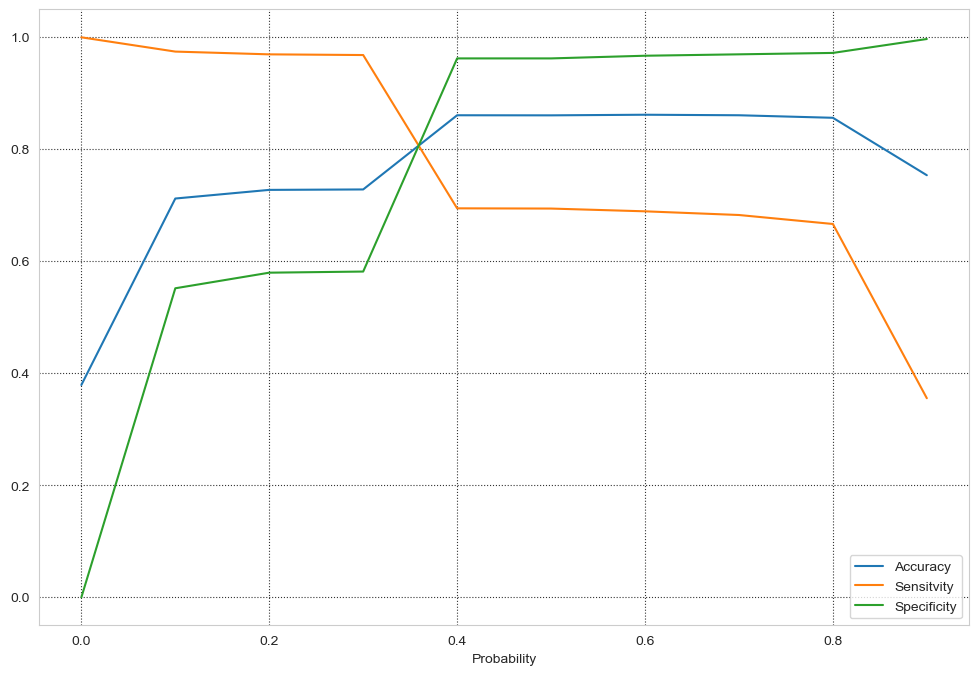

In [107]:
# Plotting 'Accuracy' , 'Sensitivity' and 'Specificity' for various probabilities(0.0 to 0.9).

df_cutoffs.plot.line(x='Probability', y=['Accuracy','Sensitvity','Specificity'], figsize=(12,8))

plt.show()

We would like both sensitivity and specificity to be high

At the same time we also would not want to spend much resources on negatives(leads who will not convert)

let's look at confusion matrix with threshold 0.4 for now.

In [120]:
# Predicting the outcomes with probability cutoff as 0.4 by creating new columns in the final dataset

y_train_pred_final['Predicted']=y_train_pred_final['Converted_probability'].map(lambda x:1 if x >0.4 else 0 )  # Predicted value 

y_train_pred_final.head()

,Converted,Converted_probability,ID,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,Predicted
1769,0,0.314497,1769,1,1,1,1,0,0,0,0,0,0,0
9206,0,0.004516,9206,1,0,0,0,0,0,0,0,0,0,0
6350,0,0.314497,6350,1,1,1,1,0,0,0,0,0,0,0
506,0,0.314497,506,1,1,1,1,0,0,0,0,0,0,0
6990,1,0.868696,6990,1,1,1,1,1,1,1,1,1,0,1


In [121]:
# Creating confusion matrix to find all the metrics

confusion_pr_train= confusion_matrix(y_train_pred_final.Converted,y_train_pred_final.Predicted)

confusion_pr_train

array([[3833,  150],
       [ 743, 1690]], dtype=int64)

In [122]:
#Sensitivity score
Sensitivity_train =round((confusion_pr_train[1,1]/(confusion_pr_train[1,0]+confusion_pr_train[1,1])*100),2)  

#specificity score
Specificity_train =round((confusion_pr_train[0,0]/(confusion_pr_train[0,0]+confusion_pr_train[0,1])*100),2)  

#print both
print('Sensitivity:',Sensitivity_train)  
print('Specificity:',Specificity_train) 

Sensitivity: 69.46
Specificity: 96.23


In [123]:
#  Pecision score
Precision_train = round((confusion_pr_train[1,1]/(confusion_pr_train[0,1]+confusion_pr_train[1,1])*100),2)

#  Recall score
Recall_train = round((confusion_pr_train[1,1]/(confusion_pr_train[1,0]+confusion_pr_train[1,1])*100),2)

#print both
print('Precision:',Precision_train) 
print('Recall:',Recall_train)     

Precision: 91.85
Recall: 69.46


In [124]:
# Checking accuracy for train dataset 
from sklearn import metrics

Accuracy_train = round(metrics.accuracy_score(y_train_pred_final.Converted,y_train_pred_final.Predicted)*100,2)
print('Train set Accuracy:',Accuracy_train)

Train set Accuracy: 86.08


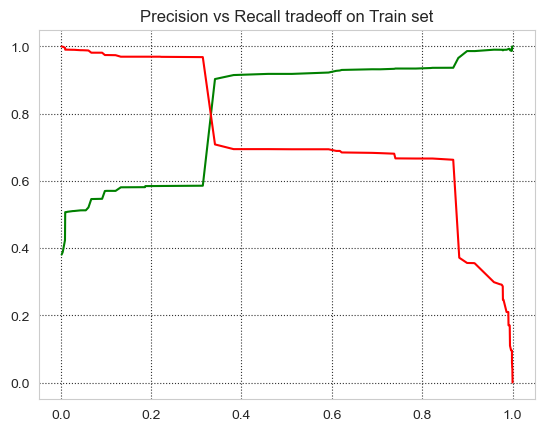

In [125]:
# importing precision recall curve from sklearn library for train set

from sklearn.metrics import precision_recall_curve, f1_score

# Creating precision recall curve by creating three points and plotting

p ,r, thresholds=precision_recall_curve(y_train_pred_final.Converted,y_train_pred_final.Converted_probability)
plt.title('Precision vs Recall tradeoff on Train set')
plt.plot(thresholds, p[:-1], "g-")    # Plotting precision
plt.plot(thresholds, r[:-1], "r-")    # Plotting Recall
plt.show()

### Prediction on the test dataset

In [126]:
# Predicting the test dataset with our final model

test_cols= X_train_4.columns[1:]              # Taking the same column train set has

X_test_final= X_test[test_cols]               # Updating it in the final test set

X_test_final= sm.add_constant(X_test_final)   # Adding constant to the final set set

y_pred_test=logr4.predict(X_test_final)      # Predicting the final test set

In [127]:
# Creating a new dataset and saving the prediction values in it

y_test_pred_final=pd.DataFrame({'Converted':y_test.values,'Converted_Probability':y_pred_test,'ID':y_test.index})

y_test_pred_final.head()   # viewing first 5 rows

,Converted,Converted_Probability,ID
5117,0,0.061407,5117
9048,1,0.091683,9048
9222,0,0.314497,9222
497,0,0.004516,497
7162,0,0.009495,7162


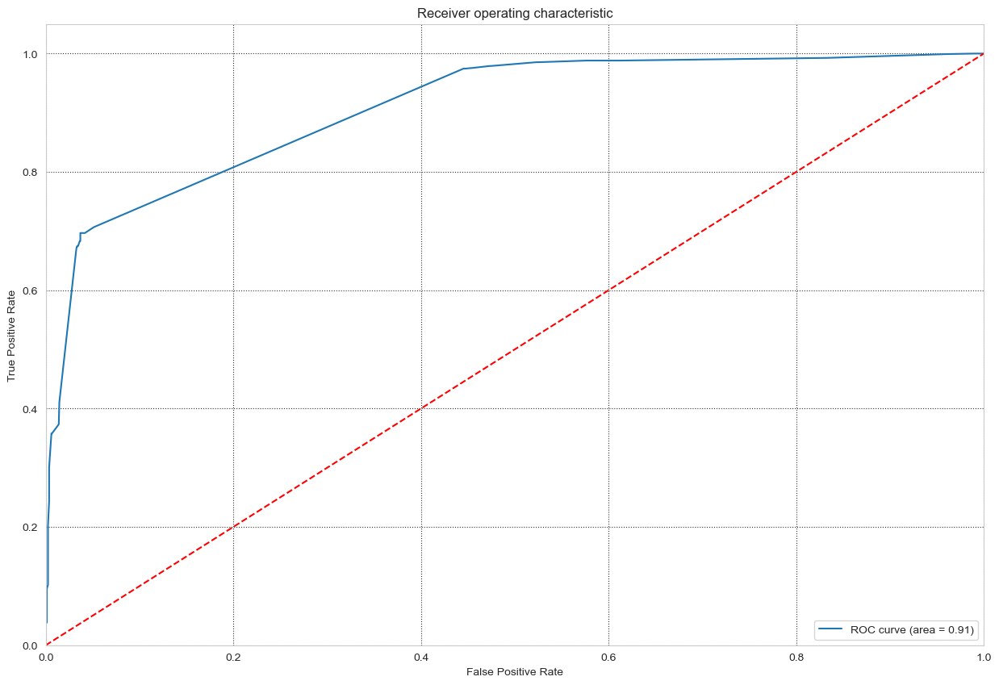

In [128]:
# ROC curve function for plotting

draw_roc(y_test_pred_final.Converted, y_test_pred_final.Converted_Probability)

### Model Evaluation

In [129]:
# Predicting the outcomes with probability cutoff as 0.4 by creating new columns in the final test dataset

y_test_pred_final['Predicted']=y_test_pred_final['Converted_Probability'].map(lambda x:1 if x >0.4 else 0 )  # Predicted value 

y_test_pred_final.head()

,Converted,Converted_Probability,ID,Predicted
5117,0,0.061407,5117,0
9048,1,0.091683,9048,0
9222,0,0.314497,9222,0
497,0,0.004516,497,0
7162,0,0.009495,7162,0


In [130]:
# Creating confusion matrix to find precision and recall score

confusion_pr_test=confusion_matrix(y_test_pred_final.Converted,y_test_pred_final.Predicted)
confusion_pr_test

array([[1586,   67],
       [ 333,  765]], dtype=int64)

In [131]:
#Sensitivity score
Sensitivity_test =round((confusion_pr_test[1,1]/(confusion_pr_test[1,0]+confusion_pr_test[1,1])*100),2)  

#specificity score
Specificity_test =round((confusion_pr_test[0,0]/(confusion_pr_test[0,0]+confusion_pr_test[0,1])*100),2)  

#print both
print('Sensitivity:',Sensitivity_test)   
print('Specificity:',Specificity_test) 

Sensitivity: 69.67
Specificity: 95.95


In [132]:
#  Pecision score
Precision_test = round((confusion_pr_test[1,1]/(confusion_pr_test[0,1]+confusion_pr_test[1,1])*100),2)

#  Recall score
Recall_test = round((confusion_pr_test[1,1]/(confusion_pr_test[1,0]+confusion_pr_test[1,1])*100),2)

#print both
print('Precision:',Precision_test) 
print('Recall:',Recall_test)     

Precision: 91.95
Recall: 69.67


In [133]:
# Checking test set accuracy

Accuracy_test = round(metrics.accuracy_score(y_test_pred_final.Converted,y_test_pred_final.Predicted)*100,2)
print('Test set Accuracy:',Accuracy_test)

Test set Accuracy: 85.46


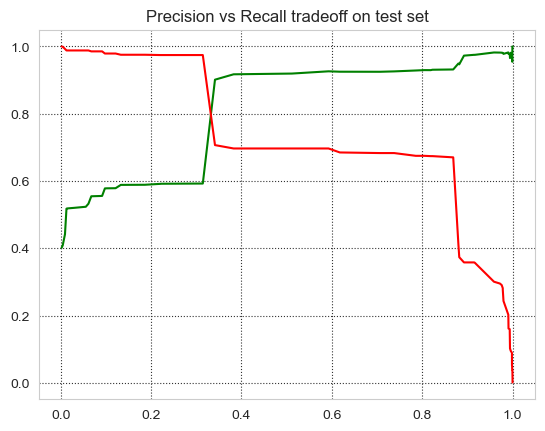

In [134]:
# Creating precision recall curve by crreating three points and plotting

p ,r, thresholds=precision_recall_curve(y_test_pred_final.Converted, y_test_pred_final.Converted_Probability)
plt.title('Precision vs Recall tradeoff on test set')
plt.plot(thresholds, p[:-1], "g-")    # Plotting precision
plt.plot(thresholds, r[:-1], "r-")    # Plotting Recall
plt.show()

In [146]:
print('F1_Score: ',f1_score(y_test_pred_final.Converted, y_test_pred_final.Predicted)*100)
print('F1_Score: ',f1_score(y_train_pred_final.Converted, y_train_pred_final.Predicted)*100)

F1_Score:  79.27461139896373
F1_Score:  79.10133395740698


### Comparison between Train data set and Test data set

In [148]:
print('Train Data Set metrics:')
print()
print('Sensitivity:',Sensitivity_train)   
print('Specificity:',Specificity_train)
print('Precision:',Precision_train) 
print('Recall:',Recall_train)
print('Accuracy:',Accuracy_train)
print('F1_Score: ',f1_score(y_train_pred_final.Converted, y_train_pred_final.Predicted)*100)

print()

print('Test Data Set metrics:')
print()
print('Sensitivity:',Sensitivity_test)   
print('Specificity:',Specificity_test)
print('Precision:',Precision_test) 
print('Recall:',Recall_test)
print('Accuracy:',Accuracy_test)
print('F1_Score: ',f1_score(y_test_pred_final.Converted, y_test_pred_final.Predicted)*100)

Train Data Set metrics:

Sensitivity: 69.46
Specificity: 96.23
Precision: 91.85
Recall: 69.46
Accuracy: 86.08
F1_Score:  79.10133395740698

Test Data Set metrics:

Sensitivity: 69.67
Specificity: 95.95
Precision: 91.95
Recall: 69.67
Accuracy: 85.46
F1_Score:  79.27461139896373


In [152]:
# lead score: lower score (Prob. of conversion lower) ; higher score (Prob. of conversion higher)

y_test_pred_final['Lead Score']= y_test_pred_final['Converted_Probability'].apply(lambda x:round(x*100))

y_test_pred_final.head(30)

,Converted,Converted_Probability,ID,Predicted,Lead Score
5117,0,0.061407,5117,0,6
9048,1,0.091683,9048,0,9
9222,0,0.314497,9222,0,31
497,0,0.004516,497,0,0
7162,0,0.009495,7162,0,1
7220,1,0.314497,7220,0,31
2702,0,0.004516,2702,0,0
6460,1,0.868696,6460,1,87
295,0,0.314497,295,0,31
6383,1,0.999942,6383,1,100


### Conclusion:

-- The Sensitivity and Specificity, Accuracy, Precision and Recall score we got from test set are almost similar to train set.

-- No concerns with respect to overfitting

-- Model is generalizing well & possess good stability

-- However, interms of exactly predicting the lead conversion it can still do better. Since, the recall or sensitivity slightly in lower end


### Valuable Insights:

In [155]:
# checking all the coefficients from the final Model:

logr4.params.sort_values(ascending = False)

Tags_Lost to EINS                                         8.536723
Tags_Closed by Horizzon                                   8.458760
Tags_Busy                                                 3.990670
Tags_Will revert after reading the email                  3.868249
Tags_in touch with EINS                                   3.394666
Tags_Want to take admission but has financial problems    3.382832
Lead Origin_Lead Add Form                                 2.773458
Last Notable Activity_SMS Sent                            2.668656
Last Activity_Had a Phone Conversation                    2.314417
What is your current occupation_Working Professional      1.358837
Tags_Ringing                                             -0.748086
Do Not Email                                             -1.514073
What is your current occupation_Unemployed               -1.815022
const                                                    -2.832407
dtype: float64

#### Most important variables to consider:
    
-- 'Tags_Lost to EINS;':  If this variable is True or 1, then the log-odds increases by 8.53

-- 'Tags_Closed by Horizzon': If this variable is True or 1, then the log-odds increases by 8.45
    
-- 'Tags_Busy': If this variable is True or 1, then the log-odds increases by 3.99
    
#####################################################################

-- 'Occupation_Unemployed': If the current status 'Unemployed', then the log odds decrease by 1.81
    
-- 'Do not email': If this variable is True or 1, then the log-odds decrease by 1.51

-- 'Tags_Ringing': If the current status / tag is 'Ringing', then the log odds decrease by 0.74


The higher the magnitude of coefficients,|Coef_|, the greater is it's control on the final decision. A high value of a variable with high positive coefficient inreases the lead score while a high values of a variable with negative coefficient decreases the lead score.

                                         ##### EOD ####